# Import Libraries

In [1]:
import numpy as np
import pandas as pd
import pandas_profiling as pp
import math
import random
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# preprocessing
import sklearn
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, learning_curve, ShuffleSplit, RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score, GroupKFold
from sklearn.model_selection import cross_val_predict as cvp
from sklearn import metrics
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score, confusion_matrix, explained_variance_score
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import SelectFromModel, SelectKBest, RFE, chi2

# models
from sklearn.linear_model import LinearRegression, LogisticRegression, Perceptron, RidgeClassifier, SGDClassifier, LassoCV, LogisticRegressionCV
from sklearn.svm import SVC, LinearSVC, SVR
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier, IsolationForest
from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier, RadiusNeighborsClassifier, NearestCentroid
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn import metrics
import xgboost as xgb
from xgboost import XGBClassifier, XGBRFClassifier
import lightgbm as lgb
from lightgbm import LGBMClassifier


# NN models
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras import optimizers
from keras.wrappers.scikit_learn import KerasClassifier
from pytorch_tabnet.tab_model import TabNetClassifier

import warnings
warnings.filterwarnings("ignore")

import preprocessing

pd.set_option('display.max_columns', None)
pd.set_option('float_format', '{:f}'.format)

from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 12, 4

In [63]:
dataset1

,d.barcode,DP,VD,AF,HIAF,IMPACT,SYMBOL,loci,sampleTimePt,gender,MSID,BIAS,REFBIAS,VARBIAS,QUAL,ODDRATIO,chipOrControl
0,4010289633,7281,26,0.003600,0.003300,MODERATE,GNB1,chr1:1747196_T/C,Baseline,Male,MS2083,2:2,3644:3596,12:14,34.000000,1.182210,CHIP
1,4010289633,7281,26,0.003600,0.003300,MODERATE,GNB1,chr1:1747196_T/C,Baseline,Male,MS2083,2:2,3644:3596,12:14,34.000000,1.182210,CHIP
2,4010289633,7281,26,0.003600,0.003300,MODERATE,GNB1,chr1:1747196_T/C,Baseline,Male,MS2083,2:2,3644:3596,12:14,34.000000,1.182210,CHIP
3,4010289633,7281,26,0.003600,0.003300,MODERATE,GNB1,chr1:1747196_T/C,Baseline,Male,MS2083,2:2,3644:3596,12:14,34.000000,1.182210,CHIP
4,4010289633,7282,29,0.004000,0.003600,MODERATE,GNB1,chr1:1747250_T/C,Baseline,Male,MS2083,2:2,3639:3606,15:14,32.700000,1.061729,CHIP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1137944,4010290016,731,2,0.002700,0.002800,MODERATE,ZFY,chrY:2848011_C/T,Blank,Blank,NaN,2:2,371:357,1:1,31.000000,1.039170,NaN
1137945,4010290016,731,2,0.002700,0.002800,MODERATE,ZFY,chrY:2848029_C/T,Blank,Blank,NaN,2:2,367:359,1:1,37.000000,1.022260,NaN
1137946,4010290016,731,2,0.002700,0.002800,MODERATE,ZFY,chrY:2848029_C/T,Blank,Blank,NaN,2:2,367:359,1:1,37.000000,1.022260,NaN
1137947,4010290016,731,2,0.002700,0.002800,MODERATE,ZFY,chrY:2848029_C/T,Blank,Blank,NaN,2:2,367:359,1:1,37.000000,1.022260,NaN


In [2]:
df = pd.read_csv("../data/chipVariantCalling_run1.tsv", sep='\t')
df2 = pd.read_csv("../data/chipVariantCalling_run2.tsv", sep='\t')

df

,d.barcode,DP,VD,AF,HIAF,IMPACT,SYMBOL,loci,sampleTimePt,gender,MSID,BIAS,REFBIAS,VARBIAS,QUAL,ODDRATIO,chipOrControl
0,4010289633,7281,26,0.003600,0.003300,MODERATE,GNB1,chr1:1747196_T/C,Baseline,Male,MS2083,2:2,3644:3596,12:14,34.000000,1.182210,CHIP
1,4010289633,7281,26,0.003600,0.003300,MODERATE,GNB1,chr1:1747196_T/C,Baseline,Male,MS2083,2:2,3644:3596,12:14,34.000000,1.182210,CHIP
2,4010289633,7281,26,0.003600,0.003300,MODERATE,GNB1,chr1:1747196_T/C,Baseline,Male,MS2083,2:2,3644:3596,12:14,34.000000,1.182210,CHIP
3,4010289633,7281,26,0.003600,0.003300,MODERATE,GNB1,chr1:1747196_T/C,Baseline,Male,MS2083,2:2,3644:3596,12:14,34.000000,1.182210,CHIP
4,4010289633,7282,29,0.004000,0.003600,MODERATE,GNB1,chr1:1747250_T/C,Baseline,Male,MS2083,2:2,3639:3606,15:14,32.700000,1.061729,CHIP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1137944,4010290016,731,2,0.002700,0.002800,MODERATE,ZFY,chrY:2848011_C/T,Blank,Blank,NaN,2:2,371:357,1:1,31.000000,1.039170,NaN
1137945,4010290016,731,2,0.002700,0.002800,MODERATE,ZFY,chrY:2848029_C/T,Blank,Blank,NaN,2:2,367:359,1:1,37.000000,1.022260,NaN
1137946,4010290016,731,2,0.002700,0.002800,MODERATE,ZFY,chrY:2848029_C/T,Blank,Blank,NaN,2:2,367:359,1:1,37.000000,1.022260,NaN
1137947,4010290016,731,2,0.002700,0.002800,MODERATE,ZFY,chrY:2848029_C/T,Blank,Blank,NaN,2:2,367:359,1:1,37.000000,1.022260,NaN


In [3]:
dataset1 = df
dataset2 = df2

In [4]:
df = dataset1
df2 = dataset2

In [44]:
chip1 = dataset1
chip2 = dataset2

Remove `NaN` and `Unknown` values within `chipOrControl`

In [5]:
df = preprocessing.remove_redundant(df)
df2 = preprocessing.remove_redundant(df2)

In [64]:
preprocessing.remove_redundant(dataset1)

,DP,VD,AF,HIAF,IMPACT,SYMBOL,loci,sampleTimePt,gender,MSID,BIAS,REFBIAS,VARBIAS,QUAL,ODDRATIO,chipOrControl
0,7281,26,0.003600,0.003300,MODERATE,GNB1,chr1:1747196_T/C,Baseline,Male,MS2083,2:2,3644:3596,12:14,34.000000,1.182210,CHIP
4,7282,29,0.004000,0.003600,MODERATE,GNB1,chr1:1747250_T/C,Baseline,Male,MS2083,2:2,3639:3606,15:14,32.700000,1.061729,CHIP
8,7282,24,0.003300,0.003300,MODERATE,GNB1,chr1:1747256_T/C,Baseline,Male,MS2083,2:2,3626:3607,12:12,34.900000,1.005270,CHIP
12,178,2,0.011200,0.012000,MODERATE,NRAS,chr1:115256571_T/C,Baseline,Male,MS2083,2:2,88:88,1:1,37.000000,1.000000,CHIP
13,1773,6,0.003400,0.003500,MODERATE,NRAS,chr1:115258674_T/C,Baseline,Male,MS2083,2:2,889:874,3:3,37.000000,1.017150,CHIP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
536725,711,2,0.002800,0.002800,MODERATE,BRCC3,chrX:154305513_C/T,Y3,Female,MS6625,2:2,356:353,1:1,31.000000,1.008490,Control
536726,711,2,0.002800,0.002900,MODERATE,BRCC3,chrX:154305518_T/C,Y3,Female,MS6625,2:2,355:353,1:1,37.000000,1.005660,Control
536733,711,2,0.002800,0.002900,HIGH,BRCC3,chrX:154305518_T/C,Y3,Female,MS6625,2:2,355:353,1:1,37.000000,1.005660,Control
536734,711,2,0.002800,0.002900,MODERATE,BRCC3,chrX:154305533_A/T,Y3,Female,MS6625,2:2,356:353,1:1,37.000000,1.008490,Control


In [6]:
df.head()

,DP,VD,AF,HIAF,IMPACT,SYMBOL,loci,sampleTimePt,gender,MSID,BIAS,REFBIAS,VARBIAS,QUAL,ODDRATIO,chipOrControl
0,7281,26,0.003600,0.003300,MODERATE,GNB1,chr1:1747196_T/C,Baseline,Male,MS2083,2:2,3644:3596,12:14,34.000000,1.182210,CHIP
4,7282,29,0.004000,0.003600,MODERATE,GNB1,chr1:1747250_T/C,Baseline,Male,MS2083,2:2,3639:3606,15:14,32.700000,1.061729,CHIP
8,7282,24,0.003300,0.003300,MODERATE,GNB1,chr1:1747256_T/C,Baseline,Male,MS2083,2:2,3626:3607,12:12,34.900000,1.005270,CHIP
12,178,2,0.011200,0.012000,MODERATE,NRAS,chr1:115256571_T/C,Baseline,Male,MS2083,2:2,88:88,1:1,37.000000,1.000000,CHIP
13,1773,6,0.003400,0.003500,MODERATE,NRAS,chr1:115258674_T/C,Baseline,Male,MS2083,2:2,889:874,3:3,37.000000,1.017150,CHIP


Separate `loci` into three separate columns: `chromosome` | `chromosome_location` | `nucleotide`

In [7]:
df = preprocessing.loci_split(df)
df2 = preprocessing.loci_split(df2)

In [8]:
df.drop("chromosome_loc", axis = 1, inplace=True)
df2.drop("chromosome_loc", axis = 1, inplace=True)

Columns `REFBIAS` and `VARBIAS` are strings. Change to floats.

In [9]:
df = preprocessing.convert_ratios(df, ["REFBIAS", "VARBIAS"])
df2 = preprocessing.convert_ratios(df2, ["REFBIAS", "VARBIAS"])

In [10]:
df = df[df["BIAS"].str.contains("2:2")]
df = df[df['ODDRATIO'] > 0]

df2 = df2[df2["BIAS"].str.contains("2:2")]
df2 = df2[df2['ODDRATIO'] > 0]

In [11]:
df.drop("BIAS", axis = 1, inplace=True)
df2.drop("BIAS", axis = 1, inplace=True)

In [12]:
genes = sorted(df.SYMBOL.unique())
genes2 = sorted(df2.SYMBOL.unique())

In [13]:
df_model = pd.concat([df,pd.get_dummies(df['SYMBOL'], prefix='GENE')],axis=1)
df_model2 = pd.concat([df2,pd.get_dummies(df2['SYMBOL'], prefix='GENE')],axis=1)

In [14]:
df_model.head()

,DP,VD,AF,HIAF,IMPACT,SYMBOL,sampleTimePt,gender,MSID,REFBIAS,VARBIAS,QUAL,ODDRATIO,chipOrControl,chromosome,nucleotide,GENE_AC078842.3,GENE_AMELY,GENE_ASXL1,GENE_ASXL2,GENE_BCOR,GENE_BCORL1,GENE_BRAF,GENE_BRCC3,GENE_CBL,GENE_CERKL,GENE_CHMP4B,GENE_CREBBP,GENE_DNAH2,GENE_DNMT3A,GENE_GNAS,GENE_GNB1,GENE_IDH2,GENE_JAK2,GENE_KRAS,GENE_LIPI,GENE_LY9,GENE_NOTCH1,GENE_NOTCH2,GENE_NRAS,GENE_PPM1D,GENE_PTPN11,GENE_RAD21,GENE_RP11-661A12.9,GENE_SF3B1,GENE_SNX18,GENE_SRSF2,GENE_SRY,GENE_SYNE1,GENE_TET1,GENE_TET2,GENE_TP53,GENE_U2AF1,GENE_ZFX,GENE_ZFY
0,7281,26,0.003600,0.003300,MODERATE,GNB1,Baseline,Male,MS2083,1.013348,0.857143,34.000000,1.182210,CHIP,chr1,T/C,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,7282,29,0.004000,0.003600,MODERATE,GNB1,Baseline,Male,MS2083,1.009151,1.071429,32.700000,1.061729,CHIP,chr1,T/C,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,7282,24,0.003300,0.003300,MODERATE,GNB1,Baseline,Male,MS2083,1.005268,1.000000,34.900000,1.005270,CHIP,chr1,T/C,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12,178,2,0.011200,0.012000,MODERATE,NRAS,Baseline,Male,MS2083,1.000000,1.000000,37.000000,1.000000,CHIP,chr1,T/C,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
13,1773,6,0.003400,0.003500,MODERATE,NRAS,Baseline,Male,MS2083,1.017162,1.000000,37.000000,1.017150,CHIP,chr1,T/C,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [15]:
# Remove other genes from dataframe
df_model = df_model[['DP', 'VD', 'AF', 'HIAF', 'IMPACT', 'sampleTimePt', 'gender', 'MSID',
       'REFBIAS', 'VARBIAS', 'QUAL', 'ODDRATIO', 'chipOrControl', 'chromosome',
       'nucleotide', 'GENE_DNMT3A', 'GENE_TET2', 'GENE_TP53', 'GENE_ASXL1', 'GENE_BCOR']]

df_model2 = df_model2[['DP', 'VD', 'AF', 'HIAF', 'IMPACT', 'sampleTimePt', 'gender', 'MSID',
       'REFBIAS', 'VARBIAS', 'QUAL', 'ODDRATIO', 'chipOrControl', 'chromosome',
       'nucleotide', 'GENE_DNMT3A', 'GENE_TET2', 'GENE_TP53', 'GENE_ASXL1', 'GENE_BCOR']]


# Create separate dataframe
encoder = df_model[['GENE_DNMT3A', 'GENE_TET2', 'GENE_TP53', 'GENE_ASXL1', 'GENE_BCOR']]
encoder2 = df_model2[['GENE_DNMT3A', 'GENE_TET2', 'GENE_TP53', 'GENE_ASXL1', 'GENE_BCOR']]

# Sum of one hot encode. Value = 1 if exists, 0 otherwise
p = encoder[list(encoder)].sum(axis=1).array
p2 = encoder2[list(encoder2)].sum(axis=1).array

# Flip values
for i in range(len(p)):
    if p[i] == 0:
        p[i] = 1
    else:
        p[i] = 0

# Flip values
for i in range(len(p2)):
    if p2[i] == 0:
        p2[i] = 1
    else:
        p2[i] = 0
        
# Add to df
df_model["other"] = p
df_model2["other"] = p2

In [16]:
df = df_model
df2 = df_model2

In [17]:
categorical = ['IMPACT', 'sampleTimePt', 'gender', 'chipOrControl']
for i in categorical:
    df[i] = df[i].astype('category').cat.codes
    df2[i] = df2[i].astype('category').cat.codes

In [18]:
df.drop(["chromosome", "nucleotide"], axis = 1, inplace=True)
df2.drop(["chromosome", "nucleotide"], axis = 1, inplace=True)

In [19]:
# df.drop(["MSID"], axis = 1, inplace=True)
# df2.drop(["MSID"], axis = 1, inplace=True)

In [ ]:
# df_msid = df

In [ ]:
# df = df_msid.drop(["MSID"], axis = 1)
# df2.drop(["MSID"], axis = 1, inplace=True)

In [29]:
df.drop(["AF"], axis = 1, inplace=True)
df2.drop(["AF"], axis = 1, inplace=True)

In [47]:
chip1 = preprocessing.remove_redundant(chip1)
chip2 = preprocessing.remove_redundant(chip2)

chip1 = preprocessing.loci_split(chip1)
chip2 = preprocessing.loci_split(chip2)

chip1.drop("chromosome_loc", axis = 1, inplace=True)
chip2.drop("chromosome_loc", axis = 1, inplace=True)

chip1 = preprocessing.convert_ratios(chip1, ["REFBIAS", "VARBIAS"])
chip2 = preprocessing.convert_ratios(chip2, ["REFBIAS", "VARBIAS"])

In [49]:
categorical = ['IMPACT', 'sampleTimePt', 'gender', 'chipOrControl']
for i in categorical:
    chip1[i] = chip1[i].astype('category').cat.codes
    chip2[i] = chip2[i].astype('category').cat.codes

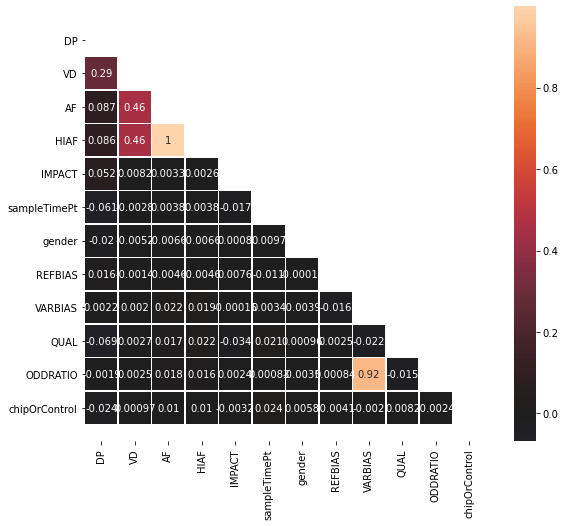

In [51]:
corrs = chip1.corr() # calculate the correlation table
# as this is a symmetric table, set up a mask so that we only plot values below the main diagonal
mask = np.triu(np.ones_like(corrs, dtype=np.bool)) 
f, ax = plt.subplots(figsize=(10, 8)) # initialise the plots and axes
# plot the correlations as a seaborn heatmap, with a colourbar
sns.heatmap(corrs, mask=mask, center=0, annot=True, square=True, linewidths=.5) 
# do some fiddling so that the top and bottom are not obscured
bottom, top = ax.get_ylim() 
ax.set_ylim(bottom + 0.5, top - 0.5);

In [53]:
chip1 = chip1[chip1["BIAS"].str.contains("2:2")]
chip1 = chip1[chip1['ODDRATIO'] > 0]

chip2 = chip2[chip2["BIAS"].str.contains("2:2")]
chip2 = chip2[chip2['ODDRATIO'] > 0]

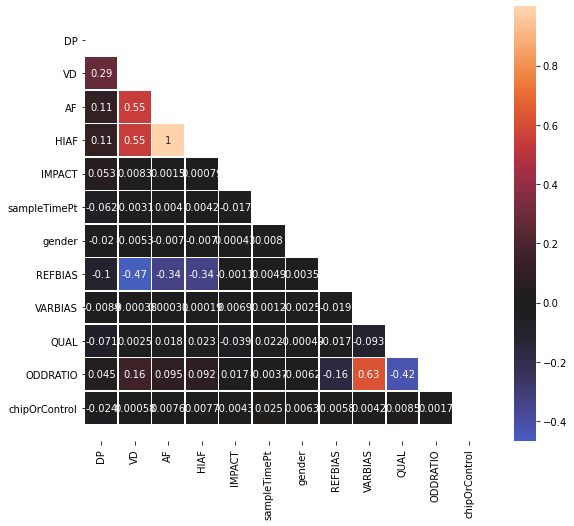

In [54]:
corrs = chip1.corr() # calculate the correlation table
# as this is a symmetric table, set up a mask so that we only plot values below the main diagonal
mask = np.triu(np.ones_like(corrs, dtype=np.bool)) 
f, ax = plt.subplots(figsize=(10, 8)) # initialise the plots and axes
# plot the correlations as a seaborn heatmap, with a colourbar
sns.heatmap(corrs, mask=mask, center=0, annot=True, square=True, linewidths=.5) 
# do some fiddling so that the top and bottom are not obscured
bottom, top = ax.get_ylim() 
ax.set_ylim(bottom + 0.5, top - 0.5);

# Modelling

In [345]:
X = df.drop(['MSID', 'chipOrControl'], axis = 1) 
y = df['chipOrControl'] 
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=.8, random_state=0)

X2 = df2.drop(['MSID', 'chipOrControl'], axis = 1) 
y2 = df2['chipOrControl'] 
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, train_size=.8, random_state=2)

In [684]:
results = pd.DataFrame()

## K-Nearest Neighbours

In [280]:
knn = KNeighborsClassifier(n_neighbors = 3, weights='distance', metric = 'manhattan', algorithm = 'kd_tree')
knn.fit(X_train, y_train)
y_predknn = knn.predict(X_test)
print('Accuracy {0}'.format(np.round(accuracy_score(y_test, y_predknn),3)))

Accuracy 0.815


In [346]:
knn = KNeighborsClassifier(n_neighbors = 10, weights='distance', metric = 'manhattan', algorithm = 'kd_tree')
knn.fit(X_train2, y_train2)
y_predknn2 = knn.predict(X_test2)
print('Accuracy {0}'.format(np.round(accuracy_score(y_test2, y_predknn2),3)))

Accuracy 0.63


In [159]:
groups = df['MSID']
group_kfold = GroaupKFold(n_splits=88)

In [160]:
group_kfold.split(X, y, groups)

<generator object _BaseKFold.split at 0x000002129C12A890>

In [163]:
groups = np.array(df['MSID'])
group_kfold = GroupKFold(n_splits=88)
scores = cross_val_score(knn, X, y, cv=group_kfold.split(X, y, groups))

In [164]:
print(scores)

[0.41539695 0.52285714 0.57001293 0.53000883 0.405804   0.45290386
 0.55272192 0.51239669 0.53962461 0.52913386 0.37473118 0.59730458
 0.57266343 0.44655453 0.43047091 0.43926789 0.4955157  0.53417576
 0.36018412 0.55069124 0.42700519 0.546875   0.56834112 0.39438268
 0.52758216 0.51120283 0.52944676 0.59499702 0.42001198 0.57699221
 0.5641953  0.42567568 0.41400876 0.58001265 0.51270648 0.4368932
 0.56026059 0.54904542 0.56717406 0.39668874 0.58410596 0.45436242
 0.4064603  0.57569586 0.3771273  0.4138641  0.52860096 0.46153846
 0.62709285 0.56891271 0.3844358  0.35224586 0.59525692 0.59531502
 0.54094293 0.52364865 0.41252302 0.52711703 0.5703125  0.57884028
 0.56778797 0.42341357 0.53347969 0.39140022 0.41091314 0.42298851
 0.61442786 0.43396226 0.54282116 0.56973684 0.54630872 0.41327913
 0.47783934 0.40194715 0.41093969 0.36546763 0.44428152 0.39753467
 0.47993019 0.45142857 0.45275591 0.437751   0.51428571 0.38926174
 0.43467337 0.44025157 0.42677824 0.57324841]


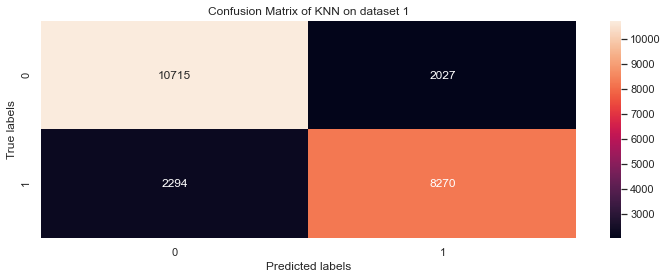

In [1157]:
ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test, y_predknn), annot=True, fmt='g');

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix of KNN on dataset 1'); 

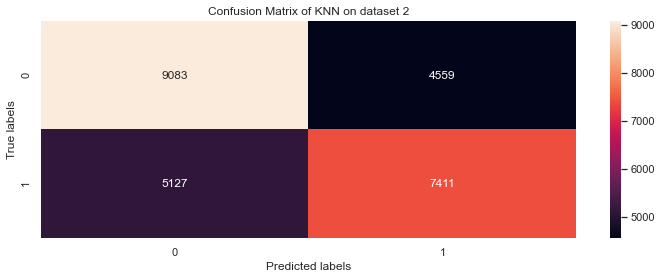

In [1158]:
ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test2, y_predknn2), annot=True, fmt='g');

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix of KNN on dataset 2'); 

Minimum error:- 0.18265682656826568 at K = 3


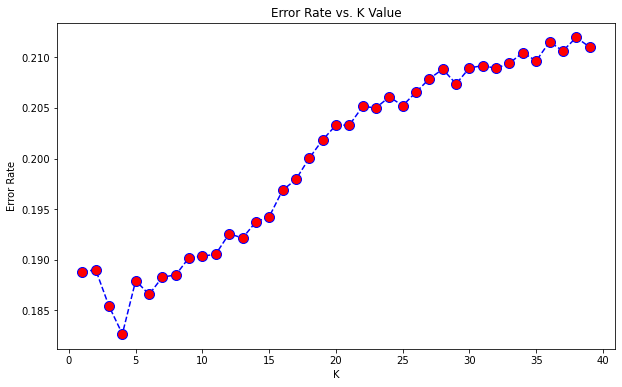

In [55]:
error_rate = []
for i in range(1,40):
    knn = KNeighborsClassifier(n_neighbors = i, weights='distance', metric = 'manhattan', algorithm = 'kd_tree')
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
print("Minimum error:-",min(error_rate),"at K =",error_rate.index(min(error_rate)))

Minimum error:- 0.36825821237585943 at K = 9


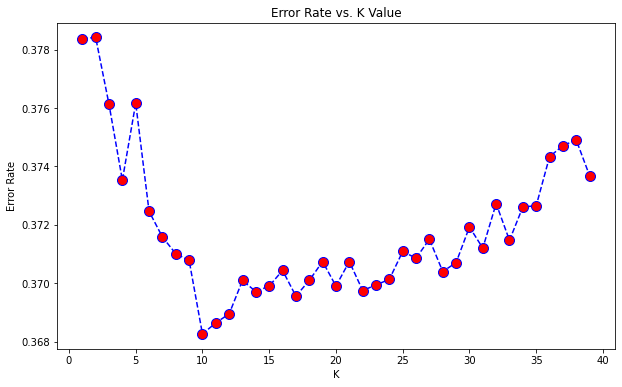

In [58]:
error_rate = []
for i in range(1,40):
    knn = KNeighborsClassifier(n_neighbors = i, weights='distance', metric = 'manhattan', algorithm = 'kd_tree')
    knn.fit(X_train2,y_train2)
    pred_i = knn.predict(X_test2)
    error_rate.append(np.mean(pred_i != y_test2))

plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
print("Minimum error:-",min(error_rate),"at K =",error_rate.index(min(error_rate)))

In [68]:
df.columns

Index(['DP', 'VD', 'HIAF', 'IMPACT', 'sampleTimePt', 'gender', 'MSID',
       'REFBIAS', 'VARBIAS', 'QUAL', 'ODDRATIO', 'chipOrControl',
       'GENE_DNMT3A', 'GENE_TET2', 'GENE_TP53', 'GENE_ASXL1', 'GENE_BCOR',
       'other'],
      dtype='object')

In [69]:
def normalise(dataframe):
    norms = dataframe[['DP', 'VD', 'HIAF', 'REFBIAS', 'VARBIAS', 'QUAL', 'ODDRATIO']]
    norms = (norms-norms.mean())/norms.std()    
    norms = pd.concat([norms, dataframe[['IMPACT', 'sampleTimePt', 'gender', 'MSID', 'chipOrControl', 
                                        'GENE_DNMT3A', 'GENE_TET2', 'GENE_TP53', 'GENE_ASXL1', 'GENE_BCOR', 'other']]],axis=1)
    return norms 

In [70]:
df_norm = normalise(df)

In [72]:
Xn = df_norm.drop(['MSID', 'chipOrControl'], axis = 1) 
yn = df_norm['chipOrControl'] 
Xn_train, Xn_test, yn_train, yn_test = train_test_split(Xn, yn, train_size=.8, random_state=0)

Minimum error:- 0.3456620612717755 at K = 14


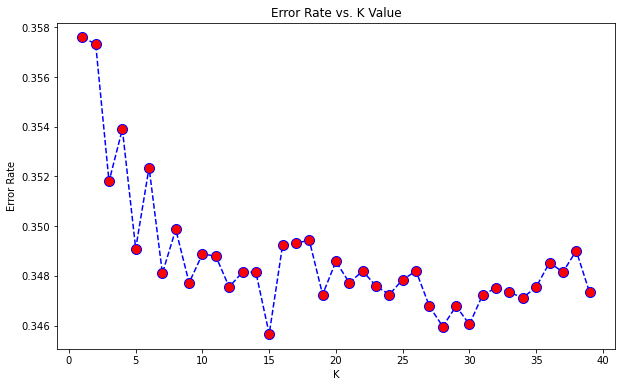

In [73]:
error_rate = []
for i in range(1,40):
    knn = KNeighborsClassifier(n_neighbors = i, weights='distance', metric = 'manhattan', algorithm = 'kd_tree')
    knn.fit(Xn_train,yn_train)
    pred_i = knn.predict(Xn_test)
    error_rate.append(np.mean(pred_i != yn_test))

plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
print("Minimum error:-",min(error_rate),"at K =",error_rate.index(min(error_rate)))

In [74]:
knn = KNeighborsClassifier(n_neighbors =14, weights='distance', metric = 'manhattan', algorithm = 'kd_tree')
knn.fit(Xn_train, yn_train)
y_pred = knn.predict(Xn_test)
print('Accuracy {0}'.format(np.round(accuracy_score(yn_test, y_pred),3)))

Accuracy 0.652


## Random Forests

In [1164]:
clf = RandomForestClassifier(n_estimators = 200)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)  
print('Accuracy {0}'.format(np.round(accuracy_score(y_test, y_pred),3)))

Accuracy 0.726


In [347]:
rfc = RandomForestClassifier(n_estimators = 100)
rfc2.fit(X_train2, y_train2)
y_predrfc2 = rfc.predict(X_test2)  
print('Accuracy {0}'.format(np.round(accuracy_score(y_test2, y_predrfc2),3)))

Accuracy 0.625


In [716]:
for i in np.arange(0.0, 1.0, 0.1):
    y_pred_prob = (rfc.predict_proba(X_test)[:,1] >= i)
    print(f"Threshold {round(i, 2)}", 'Accuracy {0}'.format(np.round(accuracy_score(y_test, y_pred_prob),3)))

Threshold 0.0 Accuracy 0.453
Threshold 0.1 Accuracy 0.539
Threshold 0.2 Accuracy 0.602
Threshold 0.3 Accuracy 0.666
Threshold 0.4 Accuracy 0.706
Threshold 0.5 Accuracy 0.724
Threshold 0.6 Accuracy 0.705
Threshold 0.7 Accuracy 0.677
Threshold 0.8 Accuracy 0.649
Threshold 0.9 Accuracy 0.612


## AdaBoost

In [662]:
ada = AdaBoostClassifier(DecisionTreeClassifier(), n_estimators=50, learning_rate = 0.5, algorithm= 'SAMME')
ada.fit(X_train, y_train)
y_predada = ada.predict(X_test)
print('Accuracy {0}'.format(np.round(accuracy_score(y_test, y_predada),3)))

Accuracy 0.807


In [348]:
ada = AdaBoostClassifier(DecisionTreeClassifier(), n_estimators=50, learning_rate = 0.5, algorithm= 'SAMME')
ada.fit(X_train2, y_train2)
y_predada2 = ada.predict(X_test2)
print('Accuracy {0}'.format(np.round(accuracy_score(y_test2, y_predada2),3)))

Accuracy 0.689


In [41]:
scores = cross_val_score(ada, X_train, y_train, cv=3)

In [42]:
scores

array([0.75973483, 0.7642402 , 0.76749051])

In [663]:
ada.feature_importances_

array([0.41492383, 0.0206268 , 0.07288457, 0.00676927, 0.02784228,
       0.03364825, 0.14237527, 0.0167836 , 0.03665466, 0.10375759,
       0.0238508 , 0.02878917, 0.01350506, 0.02202989, 0.00692314,
       0.02863581])

In [677]:
features = pd.DataFrame()
a, d = {}, {}

for name, score in zip(X.columns, ada.feature_importances_):
    a[name] = round(score, 4)
for name, score in zip(X.columns, dt.feature_importances_):
    d[name] = round(score, 4)
    
features['ADA'] = pd.Series(data=a)
features['DCT'] = pd.Series(data=d)

In [678]:
features

,ADA,DCT
DP,0.414900,0.440400
VD,0.020600,0.021400
HIAF,0.072900,0.060300
IMPACT,0.006800,0.006200
sampleTimePt,0.027800,0.024200
gender,0.033600,0.027100
REFBIAS,0.142400,0.146600
VARBIAS,0.016800,0.017700
QUAL,0.036700,0.035900
ODDRATIO,0.103800,0.096100


In [667]:
features['ADA'] = pd.Series(data=d)

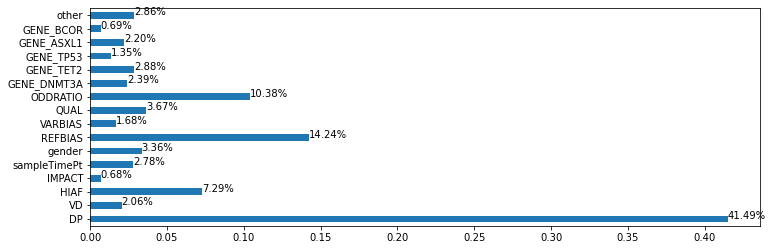

In [665]:
ax = features.plot(kind='barh') # s is a Series (float) in [0,1]
[ax.text(v, i, '{:.2f}%'.format(100*v)) for i, v in enumerate(features)];

ValueError: Unknown format code 'f' for object of type 'str'

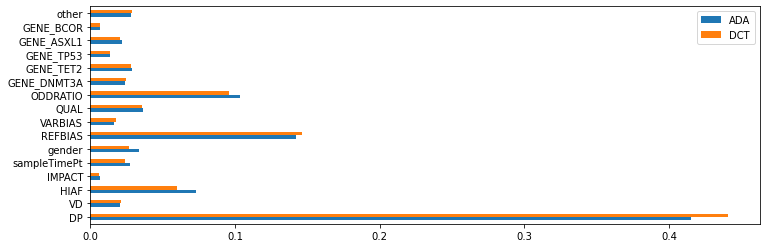

In [681]:
ax = features.plot(kind='barh') # s is a Series (float) in [0,1]
[ax.text(v, i, '{:.2f}%'.format(100*v)) for i, v in enumerate(features)];

In [713]:
for i in np.arange(0.0, 1.0, 0.1):
    y_pred_prob = (ada.predict_proba(X_test)[:,1] >= i)
    print(f"Threshold {round(i, 2)}", 'Accuracy {0}'.format(np.round(accuracy_score(y_test, y_pred_prob),3)))

Threshold 0.0 Accuracy 0.453
Threshold 0.1 Accuracy 0.453
Threshold 0.2 Accuracy 0.453
Threshold 0.3 Accuracy 0.714
Threshold 0.4 Accuracy 0.792
Threshold 0.5 Accuracy 0.807
Threshold 0.6 Accuracy 0.792
Threshold 0.7 Accuracy 0.73
Threshold 0.8 Accuracy 0.547
Threshold 0.9 Accuracy 0.547


In [23]:
groups = np.array(df['MSID'])
group_kfold = GroupKFold(n_splits=88)
scores = cross_val_score(ada, X, y, cv=group_kfold.split(X, y, groups), n_jobs = -1, verbose = 3)
print(scores)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done  88 out of  88 | elapsed: 63.6min finished


[0.40697674 0.5077551  0.58595433 0.44880847 0.37488107 0.45583211
 0.5537028  0.47727273 0.48435871 0.48818898 0.33978495 0.55040431
 0.51593733 0.42485079 0.39612188 0.43427621 0.49439462 0.55427915
 0.40563867 0.58813364 0.40219273 0.5630787  0.56016355 0.41310708
 0.54460094 0.5053066  0.49970256 0.56700417 0.38166567 0.58298382
 0.59312839 0.4490172  0.46153846 0.50474383 0.51397713 0.50614887
 0.59022801 0.53390388 0.57511582 0.45430464 0.59602649 0.43557047
 0.37281292 0.55804481 0.42477876 0.42759094 0.51274983 0.40977714
 0.57762557 0.51914242 0.38832685 0.39873916 0.55810277 0.60500808
 0.56575682 0.52956081 0.43370166 0.59847764 0.5078125  0.59613428
 0.61264016 0.37964989 0.59824369 0.39140022 0.40534521 0.46206897
 0.52985075 0.4918239  0.68387909 0.57894737 0.56510067 0.50813008
 0.50831025 0.43810848 0.3828892  0.3971223  0.43548387 0.40986133
 0.51657941 0.53333333 0.46653543 0.37550201 0.44081633 0.42281879
 0.46231156 0.54716981 0.52301255 0.53503185]


In [137]:
model = AdaBoostClassifier()
# define the grid of values to search
grid = dict()
grid['n_estimators'] = [10, 50, 100, 500]
grid['learning_rate'] = [0.0001, 0.001, 0.01, 0.1, 1.0]
# define the evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# define the grid search procedure
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, scoring='accuracy', verbose = 2)
# execute the grid search
grid_result = grid_search.fit(X, y)
# summarize the best score and configuration
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# summarize all scores that were evaluated
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


KeyboardInterrupt: 

In [139]:
confusion_matrix(y_test, y_pred)

array([[10525,  2217],
       [ 2328,  8236]], dtype=int64)

Text(0.5, 1.0, 'Confusion Matrix of AdaBoostClassifer')

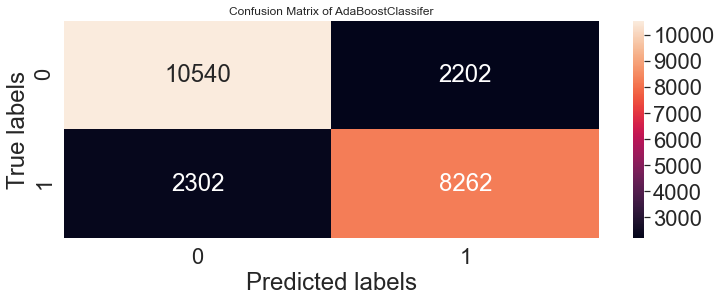

In [1141]:
ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test, y_predada), annot=True, fmt='g');

# labels, title and ticks
sns.set(font_scale=1)
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix of AdaBoostClassifer')

## Decision Trees

In [982]:
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
y_preddct = dt.predict(X_test)  
print('Accuracy {0}'.format(np.round(accuracy_score(y_test, y_preddct),3)))

Accuracy 0.788


In [349]:
dt = DecisionTreeClassifier()
dt.fit(X_train2, y_train2)
y_preddct2 = dt.predict(X_test2)  
print('Accuracy {0}'.format(np.round(accuracy_score(y_test2, y_preddct2),3)))

Accuracy 0.661


In [983]:
scores = cross_val_score(dt, X, y, cv=3)
scores

array([0.49272713, 0.498185  , 0.49631842])

In [169]:
groups = np.array(df['MSID'])
group_kfold = GroupKFold(n_splits=88)
scores = cross_val_score(DecisionTreeClassifier(), X, y, cv=group_kfold.split(X, y, groups))

In [170]:
print(scores)

[0.40978348 0.51755102 0.57906075 0.46248897 0.3715509  0.4704734
 0.55468367 0.46332645 0.48383733 0.45774278 0.39784946 0.53045822
 0.52944354 0.43136191 0.4132964  0.46866334 0.52242152 0.53589891
 0.39355581 0.56163594 0.42931333 0.54513889 0.52686916 0.41135167
 0.5592723  0.50589623 0.50803093 0.5324598  0.42720192 0.58118634
 0.57926462 0.47604423 0.45403377 0.51865908 0.48348158 0.49708738
 0.5713355  0.53258723 0.5691595  0.44304636 0.56754967 0.45302013
 0.39973082 0.57230143 0.43498979 0.43925875 0.51550655 0.41912293
 0.53805175 0.48851455 0.41245136 0.41607565 0.53043478 0.60096931
 0.53267163 0.52280405 0.4640884  0.57469077 0.55371094 0.53204476
 0.60346585 0.38512035 0.56421515 0.43660419 0.43318486 0.46551724
 0.53109453 0.52578616 0.6675063  0.55657895 0.54899329 0.49322493
 0.51939058 0.37691238 0.38429173 0.38848921 0.44428152 0.41294299
 0.47469459 0.5352381  0.46850394 0.41164659 0.45714286 0.40044743
 0.44974874 0.53144654 0.50209205 0.51592357]


In [669]:
d = {}
for name, score in zip(X.columns, dt.feature_importances_):
    d[name] = round(score, 4)
features['DCT'] = pd.Series(data=d)

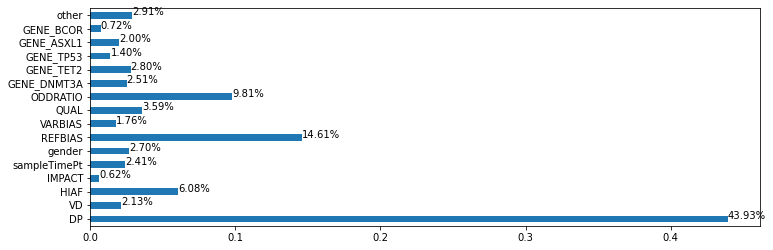

In [132]:
ax = features.plot(kind='barh') # s is a Series (float) in [0,1]
[ax.text(v, i, '{:.2f}%'.format(100*v)) for i, v in enumerate(features)];

In [351]:
d = {}
for name, score in zip(X.columns, dt.feature_importances_):
    d[name] = round(score, 4)
features = pd.Series(data=d)

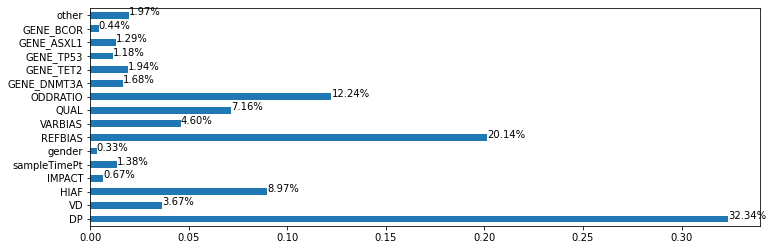

In [352]:
ax = features.plot(kind='barh') # s is a Series (float) in [0,1]
[ax.text(v, i, '{:.2f}%'.format(100*v)) for i, v in enumerate(features)];

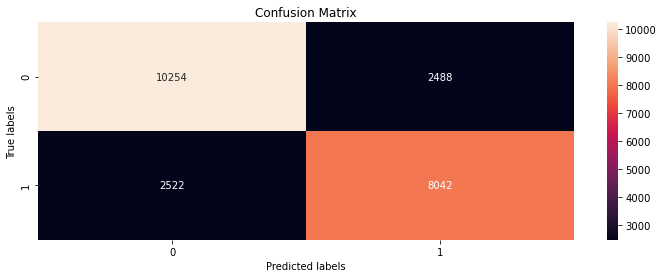

In [154]:
ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test, Y_pred), annot=True, fmt='g');

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 

# Logistic Regression

In [710]:
logreg = LogisticRegression(multi_class='ovr')
logreg.fit(X_train, y_train)
y_predlogreg = logreg.predict(X_test)  
print('Accuracy {0}'.format(np.round(accuracy_score(y_test, y_predlogreg),3)))

Accuracy 0.547


In [712]:
logreg = LogisticRegression(multi_class='ovr')
logreg.fit(X_train2, y_train2)
y_predlogreg2 = logreg.predict(X_test2)  
print('Accuracy {0}'.format(np.round(accuracy_score(y_test2, y_predlogreg2),3)))

Accuracy 0.521


# Gaussian Naive Bayes

In [535]:
gnb = GaussianNB()
gnb.fit(X_train, y_train)
y_predgnb = gnb.predict(X_test)
print('Accuracy {0}'.format(np.round(accuracy_score(y_test, y_predgnb),3)))

Accuracy 0.527


In [539]:
gnb2 = GaussianNB()
gnb2.fit(X_train2, y_train2)
y_predgnb2 = gnb2.predict(X_test2)
print('Accuracy {0}'.format(np.round(accuracy_score(y_test2, y_predgnb2),3)))

Accuracy 0.488


# XG Boost

In [727]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe

In [728]:
space={'max_depth': hp.quniform("max_depth", 3, 18, 1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': 180,
        'seed': 0
    }

In [732]:
def objective(space):
    clf=xgb.XGBClassifier(objective='binary:logistic',
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']))
    
    evaluation = [( X_train, y_train), ( X_test, y_test)]
    
    clf.fit(X_train, y_train,
            eval_set=evaluation, eval_metric="auc",
            early_stopping_rounds=10,verbose=False)
    

    pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, pred>0.5)
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }

In [733]:
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 100,
                        trials = trials)

SCORE:                                                                                                                 
0.546726164936068                                                                                                      
SCORE:                                                                                                                 
0.546726164936068                                                                                                      
SCORE:                                                                                                                 
0.546726164936068                                                                                                      
SCORE:                                                                                                                 
0.546726164936068                                                                                                      
SCORE:                                  

KeyboardInterrupt: 

In [731]:
print(best_hyperparams)

{'colsample_bytree': 0.7612404871573384, 'gamma': 8.864143614707832, 'max_depth': 13.0, 'min_child_weight': 2.0, 'reg_alpha': 69.0, 'reg_lambda': 0.5418702264735514}


In [737]:
xg = XGBClassifier(objective='binary:logistic', n_estimators=1000,seed=1, eval_metric='logloss', n_jobs = -1)
xg.fit(X_train,y_train)
y_predxgb=xg.predict(X_test)
print('Accuracy {0}'.format(np.round(accuracy_score(y_test, y_predxgb),3)))

Accuracy 0.756


In [739]:
xg2 = XGBClassifier(objective='binary:logistic', n_estimators=1000,seed=1, eval_metric='logloss', n_jobs = -1)
xg2.fit(X_train2,y_train2)
y_predxgb2 = xg2.predict(X_test2)
print('Accuracy {0}'.format(np.round(accuracy_score(y_test2, y_predxgb2),3)))

Accuracy 0.632


# Neural Nets

In [749]:
# Thanks to https://www.kaggle.com/skrudals/modification-of-neural-network-around-90
def build_nn(optimizer='adam'):

    # Initializing the NN
    nn = Sequential()

    # Adding the input layer and the first hidden layer of the NN
    nn.add(Dense(units=32, kernel_initializer='he_normal', activation='relu', input_shape=(len(X.columns),)))
    # Adding the output layer
    nn.add(Dense(units=1, kernel_initializer='he_normal', activation='sigmoid'))

    # Compiling the NN
    nn.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

    return nn

Xtrain, Xval, Ztrain, Zval = train_test_split(X, y, test_size=0.2, random_state=0)
nn_model = build_nn(optimizers.Adam(lr=0.0001))
nn_model.fit(Xtrain, Ztrain, batch_size=16, epochs=15, validation_data=(Xval, Zval))

Epoch 1/15
5827/5827 [==============================] - 14s 2ms/step - loss: 367.2527 - accuracy: 0.5182 - val_loss: 2.3499 - val_accuracy: 0.5421
Epoch 2/15
5827/5827 [==============================] - 12s 2ms/step - loss: 2.1673 - accuracy: 0.5184 - val_loss: 1.7740 - val_accuracy: 0.5454
Epoch 3/15
5827/5827 [==============================] - 12s 2ms/step - loss: 1.6681 - accuracy: 0.5181 - val_loss: 1.0980 - val_accuracy: 0.4667
Epoch 4/15
5814/5827 [============================>.] - ETA: 0s - loss: 1.7478 - accuracy: 0.5157

KeyboardInterrupt: 

# Light Gradient Boosted Machines

In [770]:
# lgb = LGBMClassifier(n_estimators=10000, num_leaves = 40, n_jobs = -1)
# lgb.fit(X_train, y_train, eval_set=[(X_test, y_test)], early_stopping_rounds=50, verbose=3)

Training until validation scores don't improve for 50 rounds
[3]	valid_0's binary_logloss: 0.682506
[6]	valid_0's binary_logloss: 0.678527
[9]	valid_0's binary_logloss: 0.675436
[12]	valid_0's binary_logloss: 0.672802
[15]	valid_0's binary_logloss: 0.670844
[18]	valid_0's binary_logloss: 0.66862
[21]	valid_0's binary_logloss: 0.667467
[24]	valid_0's binary_logloss: 0.666429
[27]	valid_0's binary_logloss: 0.664957
[30]	valid_0's binary_logloss: 0.663839
[33]	valid_0's binary_logloss: 0.663006
[36]	valid_0's binary_logloss: 0.661699
[39]	valid_0's binary_logloss: 0.660682
[42]	valid_0's binary_logloss: 0.65978
[45]	valid_0's binary_logloss: 0.659187
[48]	valid_0's binary_logloss: 0.658621
[51]	valid_0's binary_logloss: 0.657865
[54]	valid_0's binary_logloss: 0.657126
[57]	valid_0's binary_logloss: 0.65652
[60]	valid_0's binary_logloss: 0.656317
[63]	valid_0's binary_logloss: 0.65555
[66]	valid_0's binary_logloss: 0.654712
[69]	valid_0's binary_logloss: 0.653749
[72]	valid_0's binary_logl

[603]	valid_0's binary_logloss: 0.610715
[606]	valid_0's binary_logloss: 0.610541
[609]	valid_0's binary_logloss: 0.610221
[612]	valid_0's binary_logloss: 0.609994
[615]	valid_0's binary_logloss: 0.609916
[618]	valid_0's binary_logloss: 0.609844
[621]	valid_0's binary_logloss: 0.609749
[624]	valid_0's binary_logloss: 0.609436
[627]	valid_0's binary_logloss: 0.60918
[630]	valid_0's binary_logloss: 0.609063
[633]	valid_0's binary_logloss: 0.609126
[636]	valid_0's binary_logloss: 0.609174
[639]	valid_0's binary_logloss: 0.609267
[642]	valid_0's binary_logloss: 0.609352
[645]	valid_0's binary_logloss: 0.609387
[648]	valid_0's binary_logloss: 0.609438
[651]	valid_0's binary_logloss: 0.609439
[654]	valid_0's binary_logloss: 0.609416
[657]	valid_0's binary_logloss: 0.609311
[660]	valid_0's binary_logloss: 0.60922
[663]	valid_0's binary_logloss: 0.609217
[666]	valid_0's binary_logloss: 0.609296
[669]	valid_0's binary_logloss: 0.608988
[672]	valid_0's binary_logloss: 0.60865
[675]	valid_0's bin

[1206]	valid_0's binary_logloss: 0.591556
[1209]	valid_0's binary_logloss: 0.591588
[1212]	valid_0's binary_logloss: 0.59165
[1215]	valid_0's binary_logloss: 0.591608
[1218]	valid_0's binary_logloss: 0.591576
[1221]	valid_0's binary_logloss: 0.591406
[1224]	valid_0's binary_logloss: 0.59147
[1227]	valid_0's binary_logloss: 0.591443
[1230]	valid_0's binary_logloss: 0.591441
[1233]	valid_0's binary_logloss: 0.591239
[1236]	valid_0's binary_logloss: 0.591226
[1239]	valid_0's binary_logloss: 0.59128
[1242]	valid_0's binary_logloss: 0.591305
[1245]	valid_0's binary_logloss: 0.591298
[1248]	valid_0's binary_logloss: 0.591268
[1251]	valid_0's binary_logloss: 0.591422
[1254]	valid_0's binary_logloss: 0.591266
[1257]	valid_0's binary_logloss: 0.591287
[1260]	valid_0's binary_logloss: 0.591146
[1263]	valid_0's binary_logloss: 0.591168
[1266]	valid_0's binary_logloss: 0.591105
[1269]	valid_0's binary_logloss: 0.590994
[1272]	valid_0's binary_logloss: 0.590886
[1275]	valid_0's binary_logloss: 0.59

LGBMClassifier(n_estimators=10000, num_leaves=40)

In [771]:
y_predlgb = lgb.predict(X_test)
print('Accuracy {0}'.format(np.round(accuracy_score(y_test, y_predlgb),3)))

Accuracy 0.692


In [777]:
lgb = LGBMClassifier(n_estimators=1000, num_leaves = 40, n_jobs = -1)
lgb.fit(X_train, y_train, verbose=3)

LGBMClassifier(n_estimators=1000, num_leaves=40)

In [778]:
y_predlgb = lgb.predict(X_test)
print('Accuracy {0}'.format(np.round(accuracy_score(y_test, y_predlgb),3)))

Accuracy 0.675


In [779]:
lgb2 = LGBMClassifier(n_estimators=1000, num_leaves = 40, n_jobs = -1)
lgb2.fit(X_train2, y_train2)
y_predlgb2 = lgb2.predict(X_test2)
print('Accuracy {0}'.format(np.round(accuracy_score(y_test2, y_predlgb2),3)))

Accuracy 0.623


# ADA Learning Rate

In [89]:
lrates = np.arange(0.2, 2, 0.1)
results = np.zeros(len(lrates))
for i in range(1, len(lrates)):
    print(i, end='\r')
    ada_clf = AdaBoostClassifier(DecisionTreeClassifier(), n_estimators=50, learning_rate = lrates[i], algorithm= 'SAMME')
    ada_clf.fit(X_train, y_train)
    y_pred = ada_clf.predict(X_test)  # calculate the predicted values
    # evaluate the model and collect the results
    results[i] = accuracy_score(y_test, y_pred)
    print(accuracy_score(y_test, y_pred))

0.8082038959924484
0.8075602849051746
0.8047283961211705
0.8057581738608084
0.8013816184673475
0.7926285076804256
0.7907405818244229
0.7832746932120483
0.7752510083240367
0.7742641379902171
0.77370634171458
0.7697159529734833
0.7614777310563803
0.7620784347378358
0.7503647129494551
0.7183128808032266
0.7090019737406676


In [90]:
results

array([0.        , 0.8082039 , 0.80756028, 0.8047284 , 0.80575817,
       0.80138162, 0.79262851, 0.79074058, 0.78327469, 0.77525101,
       0.77426414, 0.77370634, 0.76971595, 0.76147773, 0.76207843,
       0.75036471, 0.71831288, 0.70900197])

# Compare Errors

In [379]:
testing = tX_test

In [289]:
tX_train, tX_test, ty_train, ty_test = train_test_split(df.drop(['chipOrControl'], axis = 1), 
                                                    y, train_size=.8, random_state=0)

tX_train2, tX_test2, ty_train2, ty_test2 = train_test_split(df2.drop(['chipOrControl'], axis = 1), 
                                                    y2, train_size=.8, random_state=0)

In [299]:
testing2 = tX_test2

In [300]:
testing2['ada_pred'] = pd.Series(y_predada2).values
testing2['rfc_pred'] = pd.Series(y_predrfc2).values
testing2['dct_pred'] = pd.Series(y_preddct2).values
testing2['knn_pred'] = pd.Series(y_predknn2).values
testing2['chipOrControl'] = ty_test2

In [380]:
testing['ada_pred'] = pd.Series(y_predada).values
testing['rfc_pred'] = pd.Series(y_predrfc).values
testing['dct_pred'] = pd.Series(y_preddct).values
testing['knn_pred'] = pd.Series(y_predknn).values
testing['chipOrControl'] = ty_test

In [381]:
testing = testing.sort_values(by=['MSID'])

In [318]:
testing2 = testing2.sort_values(by=['MSID'])

In [384]:
testing_ada = testing[testing['ada_pred'] != testing['chipOrControl']]
testing_dct = testing[testing['dct_pred'] != testing['chipOrControl']]
testing_knn = testing[testing['knn_pred'] != testing['chipOrControl']]
testing_rfc = testing[testing['rfc_pred'] != testing['chipOrControl']]

In [324]:
testing_ada2 = testing2[testing2['ada_pred'] != testing2['chipOrControl']]
testing_dct2 = testing2[testing2['dct_pred'] != testing2['chipOrControl']]
testing_knn2 = testing2[testing2['knn_pred'] != testing2['chipOrControl']]
testing_rfc2 = testing2[testing2['rfc_pred'] != testing2['chipOrControl']]

In [215]:
testing_both = testing_ada[testing_ada['decision_pred'] != testing_ada['chipOrControl']]

In [216]:
testing_all = testing_both[testing_both['knn_pred'] != testing_both['chipOrControl']]

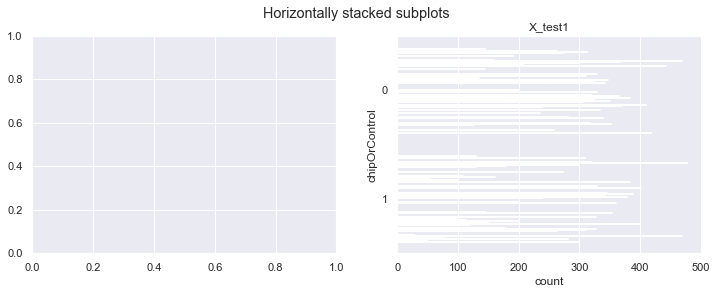

In [1165]:
fig, (ada_plot, ax2) = plt.subplots(1, 2)
fig.suptitle('Horizontally stacked subplots')
ada_plot = sns.countplot(y= 'chipOrControl', data = testing_ada, hue = 'MSID', palette='icefire')
ada_plot.set_title("AdaBoosting Errors")
ada_plot.legend_.remove()

test_plot = sns.countplot(y= 'chipOrControl', data = testing, hue = 'MSID', palette='icefire')
test_plot.set_title("X_test1")
test_plot.legend_.remove()

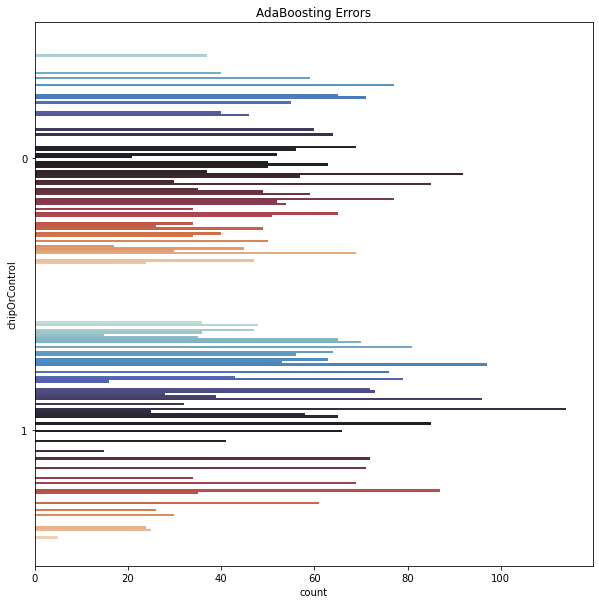

In [325]:
fig = plt.figure(figsize = (10, 10))
ada_plot = sns.countplot(y= 'chipOrControl', data = testing_ada, hue = 'MSID', palette='icefire')
ada_plot.set_title("AdaBoosting Errors")
ada_plot.legend_.remove()

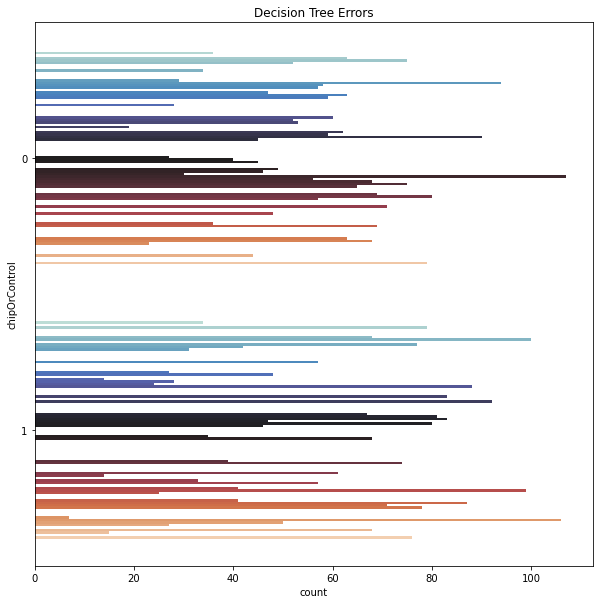

In [815]:
fig = plt.figure(figsize = (10, 10))
ada_plot = sns.countplot(y= 'chipOrControl', data = testing_dct, hue = 'MSID', palette='icefire')
ada_plot.set_title("Decision Tree Errors")
ada_plot.legend_.remove()

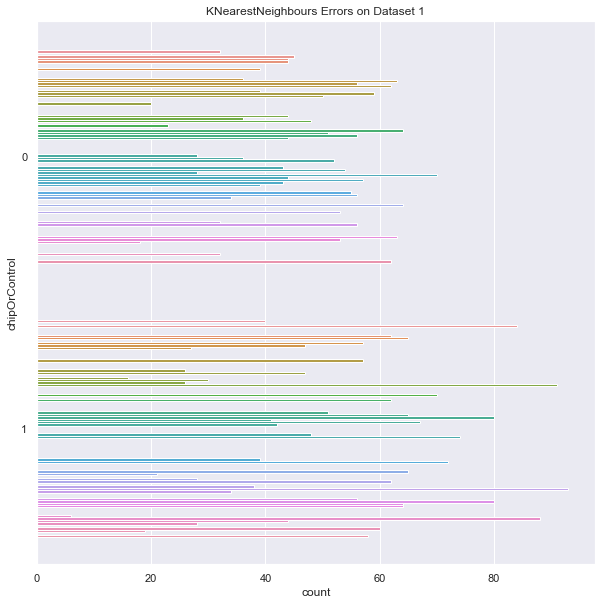

In [1162]:
fig = plt.figure(figsize = (10, 10))
knn_plot = sns.countplot(y= 'chipOrControl', data = testing_knn, hue = 'MSID')
knn_plot.set_title("KNearestNeighbours Errors on Dataset 1")
knn_plot.legend_.remove();

Text(0.5, 1.0, 'All models incorrect')

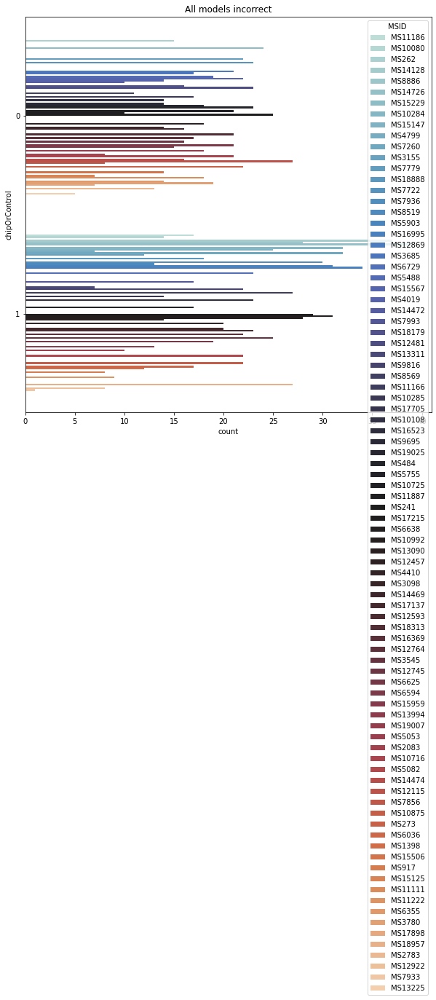

In [276]:
fig = plt.figure(figsize = (10, 10))
ada_plot = sns.countplot(y= 'chipOrControl', data = testing_all, hue = 'MSID', palette='icefire')
ada_plot.set_title("All models incorrect")
# ada_plot.legend_.remove()

In [308]:
testing2

,DP,VD,HIAF,IMPACT,sampleTimePt,gender,MSID,REFBIAS,VARBIAS,QUAL,ODDRATIO,GENE_DNMT3A,GENE_TET2,GENE_TP53,GENE_ASXL1,GENE_BCOR,other,ada_pred,rfc_pred,knn_pred,chipOrControl,dct_pred
516208,1293,4,0.003400,1,0,1,MS5082,0.736769,1.000000,37.000000,1.356926,0,1,0,0,0,0,1,0,1,1,1
378552,2721,14,0.005400,0,1,1,MS2783,0.702276,0.400000,35.300000,1.755340,0,1,0,0,0,0,0,1,1,0,0
266280,4275,14,0.003600,1,1,0,MS8886,0.211907,0.166667,33.400000,1.271370,1,0,0,0,0,0,1,1,0,1,1
526639,4040,11,0.002800,1,1,0,MS18888,1.116561,1.200000,37.000000,1.074737,0,0,0,0,0,1,1,1,1,1,0
479944,2740,10,0.003700,1,0,1,MS484,0.881944,0.666667,37.000000,1.322780,0,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
300219,896,4,0.004100,1,0,0,MS10875,0.800847,1.000000,27.500000,1.248346,0,0,0,1,0,0,1,1,1,1,1
674090,1729,22,0.011700,1,1,1,MS6355,0.849241,10.000000,34.600000,11.763322,0,0,0,0,1,0,0,0,0,0,0
134224,1973,7,0.003700,1,1,1,MS10992,0.979757,0.750000,37.000000,1.306160,0,1,0,0,0,0,1,1,1,1,1
5647,99,2,0.020400,1,1,1,MS2083,0.796296,1.000000,37.000000,1.252897,0,0,1,0,0,0,1,1,0,0,1


Text(0.5, 1.0, 'X_test1')

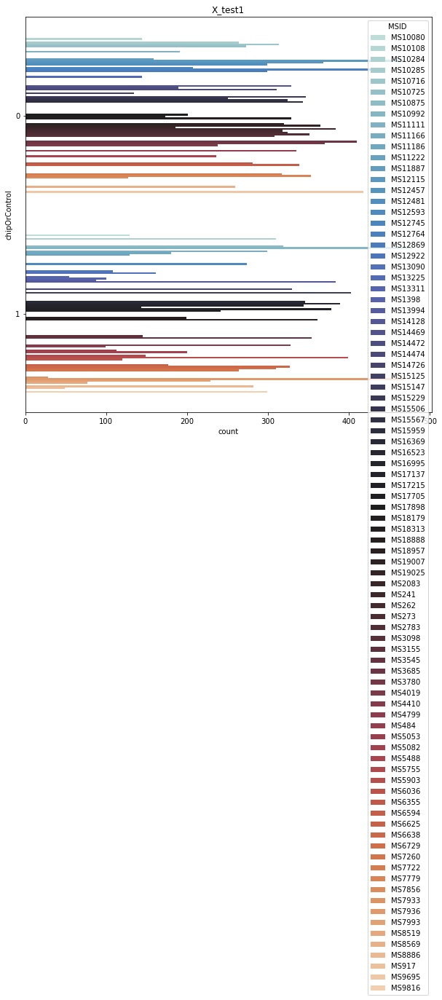

In [320]:
fig = plt.figure(figsize = (10, 10))
ada_plot = sns.countplot(y= 'chipOrControl', data = testing, hue = 'MSID', palette='icefire')
ada_plot.set_title("X_test1")
ada_plot.legend_.remove()

Text(0.5, 1.0, 'X_test2')

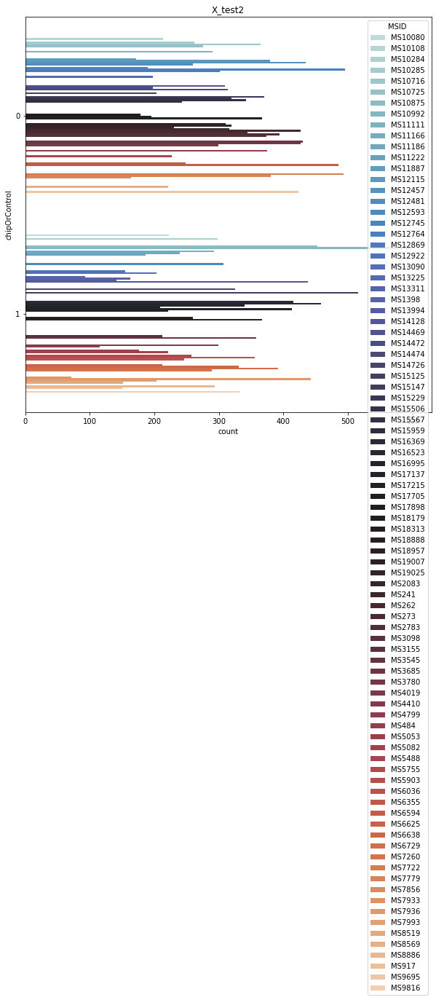

In [321]:
fig = plt.figure(figsize = (10, 10))
ada_plot = sns.countplot(y= 'chipOrControl', data = testing2, hue = 'MSID', palette='icefire')
ada_plot.set_title("X_test2")
# ada_plot.legend_.remove()

In [475]:
msid_counts = pd.DataFrame()

In [476]:
msid_counts['x_train'] = testing.MSID.value_counts(sort=False)

In [477]:
msid_counts['x_train2'] = testing2.MSID.value_counts(sort=False)

In [478]:
msid_counts['ada'] = testing_ada.MSID.value_counts(sort=False)
msid_counts['ada2'] = testing_ada2.MSID.value_counts(sort=False)

msid_counts['rfc'] = testing_rfc.MSID.value_counts(sort=False)
msid_counts['rfc2'] = testing_rfc2.MSID.value_counts(sort=False)

msid_counts['dct'] = testing_dct.MSID.value_counts(sort=False)
msid_counts['dct2'] = testing_dct2.MSID.value_counts(sort=False)

msid_counts['knn'] = testing_knn.MSID.value_counts(sort=False)
msid_counts['knn2'] = testing_knn2.MSID.value_counts(sort=False)



In [479]:
msid_counts

,x_train,x_train2,ada,ada2,rfc,rfc2,dct,dct2,knn,knn2
MS5488,236,227,46,77,50,70,48,87,53,91
MS4410,328,299,54,102,119,135,61,107,65,122
MS6638,327,331,88,122,135,146,87,124,80,155
MS11186,180,239,36,101,76,121,42,110,47,106
MS15959,343,243,40,63,45,75,45,64,44,80
...,...,...,...,...,...,...,...,...,...,...
MS12764,443,495,51,140,70,174,63,153,59,154
MS12922,108,155,26,46,51,46,27,58,26,63
MS3780,370,426,70,126,81,122,80,130,56,140
MS10108,144,213,35,76,43,69,36,78,32,74


In [480]:
pct_msid_counts = msid_counts.copy(deep=True)

In [1151]:
msid_counts

,x_train,x_train2,ada,ada2,rfc,rfc2,dct,dct2,knn,knn2
MS5488,236,227,46,77,50,70,48,87,53,91
MS4410,328,299,54,102,119,135,61,107,65,122
MS6638,327,331,88,122,135,146,87,124,80,155
MS11186,180,239,36,101,76,121,42,110,47,106
MS15959,343,243,40,63,45,75,45,64,44,80
...,...,...,...,...,...,...,...,...,...,...
MS12764,443,495,51,140,70,174,63,153,59,154
MS12922,108,155,26,46,51,46,27,58,26,63
MS3780,370,426,70,126,81,122,80,130,56,140
MS10108,144,213,35,76,43,69,36,78,32,74


In [482]:
pct_msid_counts['ada pct'] = pct_msid_counts.ada / pct_msid_counts.x_train 
pct_msid_counts['rfc pct'] = pct_msid_counts.rfc / pct_msid_counts.x_train 
pct_msid_counts['dct pct'] = pct_msid_counts.dct / pct_msid_counts.x_train 
pct_msid_counts['knn pct'] = pct_msid_counts.knn / pct_msid_counts.x_train 

pct_msid_counts['ada2 pct'] = pct_msid_counts.ada2 / pct_msid_counts.x_train2
pct_msid_counts['rfc2 pct'] = pct_msid_counts.rfc2 / pct_msid_counts.x_train2 
pct_msid_counts['dct2 pct'] = pct_msid_counts.dct2 / pct_msid_counts.x_train2 
pct_msid_counts['knn2 pct'] = pct_msid_counts.knn2 / pct_msid_counts.x_train2 

In [489]:
pct_msid_counts.drop(['x_train', 'x_train2'], axis=1, inplace=True)

In [1148]:
pct_msid_counts.round(3)

,ada pct,rfc pct,dct pct,knn pct,ada2 pct,rfc2 pct,dct2 pct,knn2 pct
MS10080,0.271,0.372,0.264,0.310,0.341,0.493,0.363,0.390
MS10108,0.243,0.299,0.250,0.222,0.357,0.324,0.366,0.347
MS10284,0.203,0.416,0.255,0.271,0.443,0.500,0.426,0.523
MS10285,0.205,0.216,0.239,0.170,0.340,0.187,0.351,0.378
MS10716,0.249,0.249,0.240,0.141,0.387,0.390,0.379,0.398
...,...,...,...,...,...,...,...,...
MS8569,0.147,0.154,0.170,0.124,0.371,0.267,0.376,0.407
MS8886,0.230,0.426,0.241,0.213,0.395,0.571,0.415,0.405
MS917,0.347,0.408,0.306,0.388,0.367,0.467,0.400,0.420
MS9695,0.160,0.215,0.189,0.148,0.319,0.310,0.348,0.343


In [491]:
pct_msid_counts1 = pct_msid_counts.drop(['ada2 pct', 'rfc2 pct', 'dct2 pct', 'knn2 pct'], axis=1)
pct_msid_counts2 = pct_msid_counts.drop(['ada pct', 'rfc pct', 'dct pct', 'knn pct'], axis=1)

In [498]:
pct_msid_counts1.T.mean()

MS5488    0.208686
MS4410    0.227896
MS6638    0.298165
MS11186   0.279167
MS15959   0.126822
            ...   
MS12764   0.137133
MS12922   0.300926
MS3780    0.193919
MS10108   0.253472
MS13090   0.322981
Length: 88, dtype: float64

In [499]:
pct_msid_counts2.T.mean()

MS5488    0.357930
MS4410    0.389632
MS6638    0.413142
MS11186   0.458159
MS15959   0.290123
            ...   
MS12764   0.313636
MS12922   0.343548
MS3780    0.303991
MS10108   0.348592
MS13090   0.428571
Length: 88, dtype: float64

In [502]:
errors = pd.DataFrame()
errors['run1_avg'] = pct_msid_counts1.T.mean()
errors['run2_avg'] = pct_msid_counts2.T.mean()

In [512]:
errors.T.describe()

,MS5488,MS4410,MS6638,MS11186,MS15959,MS6729,MS484,MS11222,MS5082,MS15125,MS9695,MS4799,MS5755,MS16523,MS6355,MS262,MS11111,MS5903,MS7936,MS9816,MS11887,MS273,MS1398,MS7260,MS3685,MS14726,MS7722,MS917,MS18179,MS7933,MS18888,MS2783,MS16369,MS10725,MS15567,MS10284,MS17705,MS4019,MS5053,MS14472,MS241,MS8569,MS10875,MS18313,MS10992,MS10080,MS12745,MS15147,MS15229,MS14469,MS18957,MS7856,MS19025,MS6036,MS8886,MS12593,MS8519,MS15506,MS3098,MS2083,MS10285,MS3155,MS3545,MS12457,MS14128,MS13225,MS12481,MS17215,MS19007,MS12115,MS13311,MS17137,MS11166,MS6625,MS13994,MS17898,MS12869,MS16995,MS10716,MS7993,MS6594,MS14474,MS7779,MS12764,MS12922,MS3780,MS10108,MS13090
count,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
mean,0.283308,0.308764,0.355654,0.368663,0.208473,0.269030,0.266269,0.329074,0.400085,0.234110,0.254008,0.295509,0.325131,0.279322,0.223450,0.211504,0.235397,0.349472,0.314018,0.318062,0.234793,0.251292,0.345437,0.420728,0.237713,0.331731,0.264343,0.387789,0.294945,0.355068,0.236041,0.260507,0.293444,0.240564,0.284113,0.379722,0.297739,0.283575,0.364397,0.242184,0.291143,0.251926,0.258616,0.228458,0.272287,0.350562,0.242013,0.295528,0.246006,0.248561,0.315639,0.240578,0.266272,0.337881,0.361955,0.327131,0.382182,0.237844,0.229254,0.220804,0.260659,0.317136,0.327165,0.235900,0.317677,0.227904,0.267726,0.304328,0.227722,0.241710,0.322730,0.389446,0.346994,0.338520,0.382676,0.220163,0.263056,0.352740,0.304192,0.309952,0.251841,0.214148,0.237060,0.225385,0.322237,0.248955,0.301032,0.375776
std,0.105531,0.114364,0.081301,0.126567,0.115471,0.032615,0.104272,0.073457,0.088508,0.120004,0.107167,0.089359,0.032694,0.075097,0.137341,0.083422,0.068199,0.080420,0.082242,0.087977,0.085227,0.080395,0.081935,0.146362,0.111110,0.080229,0.059320,0.036125,0.102392,0.085454,0.044218,0.112564,0.121727,0.085080,0.080980,0.132133,0.127661,0.092047,0.049145,0.043195,0.073838,0.146056,0.054301,0.111387,0.078856,0.065476,0.068980,0.098687,0.114581,0.111876,0.109478,0.095246,0.165402,0.068303,0.119463,0.125854,0.030818,0.059176,0.088895,0.068959,0.075339,0.021795,0.109128,0.103034,0.094789,0.066961,0.105475,0.102085,0.101076,0.093815,0.011194,0.078531,0.115886,0.063264,0.083174,0.138978,0.117790,0.096991,0.119563,0.103312,0.072480,0.074348,0.090871,0.124807,0.030139,0.077832,0.067260,0.074663
min,0.208686,0.227896,0.298165,0.279167,0.126822,0.245968,0.192537,0.277132,0.337500,0.149254,0.178230,0.232323,0.302013,0.226221,0.126335,0.152516,0.187173,0.292607,0.255864,0.255853,0.174528,0.194444,0.287500,0.317235,0.159146,0.275000,0.222397,0.362245,0.222543,0.294643,0.204774,0.180912,0.207370,0.180403,0.226852,0.286290,0.207469,0.218487,0.329646,0.211640,0.238932,0.148649,0.220219,0.149696,0.216527,0.304264,0.193237,0.225746,0.164986,0.169453,0.238227,0.173228,0.149315,0.289583,0.277482,0.238139,0.360390,0.196000,0.166396,0.172043,0.207386,0.301724,0.250000,0.163043,0.250651,0.180556,0.193144,0.232143,0.156250,0.175373,0.314815,0.333916,0.265050,0.293785,0.323864,0.121891,0.179766,0.284157,0.219649,0.236900,0.200590,0.161576,0.172805,0.137133,0.300926,0.193919,0.253472,0.322981
25%,0.245997,0.268330,0.326909,0.323915,0.167647,0.257499,0.229403,0.303103,0.368792,0.191682,0.216119,0.263916,0.313572,0.252772,0.174892,0.182010,0.21

In [526]:
testing.groupby(by=["MSID"]).mean().chipOrControl

MSID
MS10080   1.000000
MS10108   0.000000
MS10284   1.000000
MS10285   0.000000
MS10716   0.000000
            ...   
MS8569    0.000000
MS8886    1.000000
MS917     1.000000
MS9695    0.000000
MS9816    1.000000
Name: chipOrControl, Length: 88, dtype: float64

In [525]:
errors = errors.sort_index()

In [527]:
errors['chipOrControl'] = testing.groupby(by=["MSID"]).mean().chipOrControl

In [528]:
errors

,run1_avg,run2_avg,chipOrControl
MS10080,0.304264,0.396861,1.000000
MS10108,0.253472,0.348592,0.000000
MS10284,0.286290,0.473154,1.000000
MS10285,0.207386,0.313931,0.000000
MS10716,0.219649,0.388736,0.000000
...,...,...,...
MS8569,0.148649,0.355204,0.000000
MS8886,0.277482,0.446429,1.000000
MS917,0.362245,0.413333,1.000000
MS9695,0.178230,0.329787,0.000000


<AxesSubplot:xlabel='[run1_avg, run2_avg]', ylabel='[chipOrControl, chipOrControl]'>

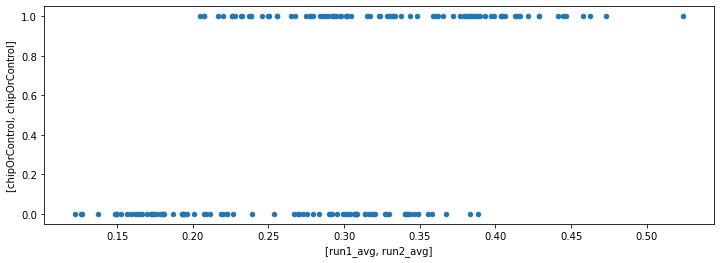

In [532]:
errors.plot.scatter(x=['run1_avg', 'run2_avg'], y=['chipOrControl', 'chipOrControl'])

<AxesSubplot:ylabel='count'>

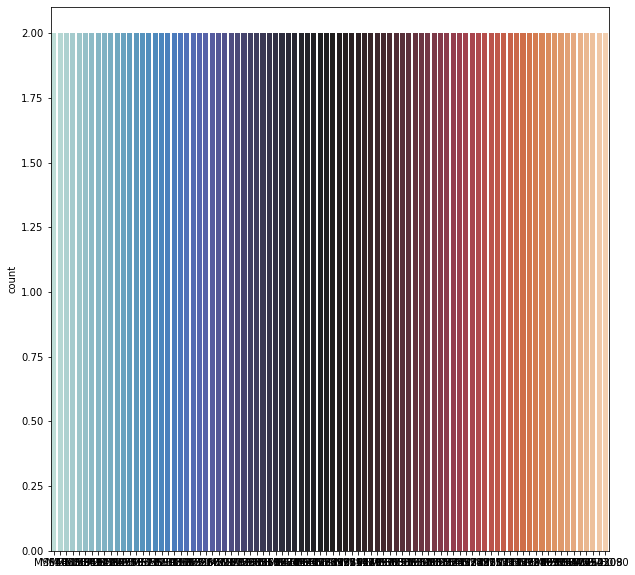

In [508]:
fig = plt.figure(figsize = (10, 10))
sns.countplot(data = errors.T, palette='icefire')
# ada_plot.set_title("X_test2")
# ada_plot.legend_.remove()

In [885]:
errorsall = errors.copy(deep=True)
pd.concat([pct_msid_counts,errorsall],axis=1)

,ada pct,rfc pct,dct pct,knn pct,ada2 pct,rfc2 pct,dct2 pct,knn2 pct,run1_avg,run2_avg,chipOrControl
MS10080,0.271,0.372,0.264,0.310,0.341,0.493,0.363,0.390,0.304,0.397,1.000
MS10108,0.243,0.299,0.250,0.222,0.357,0.324,0.366,0.347,0.253,0.349,0.000
MS10284,0.203,0.416,0.255,0.271,0.443,0.500,0.426,0.523,0.286,0.473,1.000
MS10285,0.205,0.216,0.239,0.170,0.340,0.187,0.351,0.378,0.207,0.314,0.000
MS10716,0.249,0.249,0.240,0.141,0.387,0.390,0.379,0.398,0.220,0.389,0.000
...,...,...,...,...,...,...,...,...,...,...,...
MS8569,0.147,0.154,0.170,0.124,0.371,0.267,0.376,0.407,0.149,0.355,0.000
MS8886,0.230,0.426,0.241,0.213,0.395,0.571,0.415,0.405,0.277,0.446,1.000
MS917,0.347,0.408,0.306,0.388,0.367,0.467,0.400,0.420,0.362,0.413,1.000
MS9695,0.160,0.215,0.189,0.148,0.319,0.310,0.348,0.343,0.178,0.330,0.000


In [819]:
msid_counts

,x_train,x_train2,ada,ada2,rfc,rfc2,dct,dct2,knn,knn2
MS5488,236,227,46,77,50,70,48,87,53,91
MS4410,328,299,54,102,119,135,61,107,65,122
MS6638,327,331,88,122,135,146,87,124,80,155
MS11186,180,239,36,101,76,121,42,110,47,106
MS15959,343,243,40,63,45,75,45,64,44,80
...,...,...,...,...,...,...,...,...,...,...
MS12764,443,495,51,140,70,174,63,153,59,154
MS12922,108,155,26,46,51,46,27,58,26,63
MS3780,370,426,70,126,81,122,80,130,56,140
MS10108,144,213,35,76,43,69,36,78,32,74


In [853]:
pct_msid_counts1

,ada pct,rfc pct,dct pct,knn pct
MS5488,0.195,0.212,0.203,0.225
MS4410,0.165,0.363,0.186,0.198
MS6638,0.269,0.413,0.266,0.245
MS11186,0.200,0.422,0.233,0.261
MS15959,0.117,0.131,0.131,0.128
...,...,...,...,...
MS12764,0.115,0.158,0.142,0.133
MS12922,0.241,0.472,0.250,0.241
MS3780,0.189,0.219,0.216,0.151
MS10108,0.243,0.299,0.250,0.222


In [842]:
errors['chipOrControl'] = testing.groupby(by=["MSID"]).mean().chipOrControl

In [917]:
higherror = errors.loc[(errors['run1_avg']>=0.3) & (errors['run2_avg']>= errors.run2_avg.mean())] # run2 avg = 0.354
print("Total of", len(higherror), "patients")
higherror

Total of 9 patients


,run1_avg,run2_avg,chipOrControl
MS10080,0.304,0.397,1.000
MS13090,0.323,0.429,1.000
MS13994,0.324,0.441,1.000
MS17137,0.334,0.445,1.000
MS5053,0.330,0.399,1.000
MS5082,0.338,0.463,1.000
MS7260,0.317,0.524,1.000
MS8519,0.360,0.404,1.000
MS917,0.362,0.413,1.000


In [890]:
higherror_msid = higherror.index.array

In [896]:
higherror_msid

<PandasArray>
['MS10080', 'MS13090', 'MS13994', 'MS17137',  'MS5053',  'MS5082',  'MS7260',
  'MS8519',   'MS917']
Length: 9, dtype: object

# Assume that for the above MSID, labels are incorrect

In [887]:
df_flip = df.copy(deep=True)

In [892]:
df_flip2 = df2.copy(deep=True)

In [897]:
for msid in higherror_msid:
    df_flip.loc[df_flip.MSID == msid, "chipOrControl"] = 0

In [898]:
for msid in higherror_msid:
    df_flip2.loc[df_flip2.MSID == msid, "chipOrControl"] = 0

In [907]:
Xf = df_flip.drop(['MSID', 'chipOrControl'], axis = 1) 
yf = df_flip['chipOrControl'] 
X_trainf, X_testf, y_trainf, y_testf = train_test_split(Xf, yf, train_size=.8, random_state=0)

X2f = df2.drop(['MSID', 'chipOrControl'], axis = 1) 
y2f = df2['chipOrControl'] 
X_train2f, X_test2f, y_train2f, y_test2f = train_test_split(X2f, y2f, train_size=.8, random_state=2)

# AdaBoost Flipped 

In [904]:
adaf = AdaBoostClassifier(DecisionTreeClassifier(), n_estimators=50, learning_rate = 0.5, algorithm= 'SAMME')
adaf.fit(X_trainf, y_trainf)
y_predadaf = adaf.predict(X_testf)
print('Accuracy {0}'.format(np.round(accuracy_score(y_testf, y_predadaf),3)))

Accuracy 0.823


In [908]:
adaf2 = AdaBoostClassifier(DecisionTreeClassifier(), n_estimators=50, learning_rate = 0.5, algorithm= 'SAMME')
adaf2.fit(X_train2f, y_train2f)
y_predadaf2 = adaf2.predict(X_test2f)
print('Accuracy {0}'.format(np.round(accuracy_score(y_test2f, y_predadaf2),3)))

Accuracy 0.692


# KNN Flipped

In [912]:
for i in range(2, 10):
    knnf = KNeighborsClassifier(n_neighbors = i, weights='distance', metric = 'manhattan', algorithm = 'kd_tree')
    knnf.fit(X_trainf, y_trainf)
    y_predknnf = knnf.predict(X_testf)
    print(i, 'Accuracy {0}'.format(np.round(accuracy_score(y_testf, y_predknnf),3)))

2 Accuracy 0.821
3 Accuracy 0.825
4 Accuracy 0.826
5 Accuracy 0.823
6 Accuracy 0.824
7 Accuracy 0.823
8 Accuracy 0.821
9 Accuracy 0.82


In [915]:
for i in range(10, 15):
    knn2f = KNeighborsClassifier(n_neighbors = i, weights='distance', metric = 'manhattan', algorithm = 'kd_tree')
    knn2f.fit(X_train2f, y_train2f)
    y_predknn2f = knn2f.predict(X_test2f)
    print(i, 'Accuracy {0}'.format(np.round(accuracy_score(y_test2f, y_predknn2f),3)))

10 Accuracy 0.63
11 Accuracy 0.629
12 Accuracy 0.632
13 Accuracy 0.632
14 Accuracy 0.633


In [924]:
knnf = KNeighborsClassifier(n_neighbors = 4, weights='distance', metric = 'manhattan', algorithm = 'kd_tree')
knnf.fit(X_trainf, y_trainf)
y_predknnf = knnf.predict(X_testf)
print('Accuracy {0}'.format(np.round(accuracy_score(y_testf, y_predknnf),3)))

Accuracy 0.826


In [926]:
knn2f = KNeighborsClassifier(n_neighbors = 14, weights='distance', metric = 'manhattan', algorithm = 'kd_tree')
knn2f.fit(X_train2f, y_train2f)
y_predknn2f = knn2f.predict(X_test2f)
print('Accuracy {0}'.format(np.round(accuracy_score(y_test2f, y_predknn2f),3)))

Accuracy 0.633


# RFC Flipped

In [918]:
rfcf = RandomForestClassifier(n_estimators = 100)
rfcf.fit(X_trainf, y_trainf)
y_predrfcf = rfcf.predict(X_testf)  
print('Accuracy {0}'.format(np.round(accuracy_score(y_testf, y_predrfcf),3)))

Accuracy 0.736


In [921]:
rfc2f = RandomForestClassifier(n_estimators = 100)
rfc2f.fit(X_train2f, y_train2f)
y_predrfc2f = rfc2f.predict(X_test2f)  
print('Accuracy {0}'.format(np.round(accuracy_score(y_test2f, y_predrfc2f),3)))

Accuracy 0.629


# DCT Flipped

In [927]:
dtf = DecisionTreeClassifier()
dtf.fit(X_trainf, y_trainf)
y_preddctf = dtf.predict(X_testf)  
print('Accuracy {0}'.format(np.round(accuracy_score(y_testf, y_preddctf),3)))

Accuracy 0.793


In [922]:
dt2f = DecisionTreeClassifier()
dt2f.fit(X_train2f, y_train2f)
y_preddt2f = dt2f.predict(X_test2f)  
print('Accuracy {0}'.format(np.round(accuracy_score(y_test2f, y_preddt2f),3)))

Accuracy 0.66


# Logistic Regression Flipped

In [929]:
logregf = LogisticRegression(multi_class='ovr')
logregf.fit(X_trainf, y_trainf)
y_predlogregf = logregf.predict(X_testf)  
print('Accuracy {0}'.format(np.round(accuracy_score(y_testf, y_predlogregf),3)))

Accuracy 0.599


In [930]:
logreg2f = LogisticRegression(multi_class='ovr')
logreg2f.fit(X_train2f, y_train2f)
y_predlogreg2f = logreg.predict(X_test2f)  
print('Accuracy {0}'.format(np.round(accuracy_score(y_test2f, y_predlogreg2f),3)))

Accuracy 0.521


# Gaussian Naive Bayes

In [961]:
gnbf = GaussianNB()
gnbf.fit(X_trainf, y_trainf)
y_predgnbf = gnbf.predict(X_testf)
print('Accuracy {0}'.format(np.round(accuracy_score(y_testf, y_predgnbf),3)))

Accuracy 0.463


In [932]:
gnb2f = GaussianNB()
gnb2f.fit(X_train2f, y_train2f)
y_predgnb2f = gnb2f.predict(X_test2f)
print('Accuracy {0}'.format(np.round(accuracy_score(y_test2f, y_predgnb2f),3)))

Accuracy 0.488


# XGBoost Classifer Flipped

In [933]:
xgf = XGBClassifier(objective='binary:logistic', n_estimators=1000,seed=1, eval_metric='logloss', n_jobs = -1)
xgf.fit(X_trainf,y_trainf)
y_predxgbf = xgf.predict(X_testf)
print('Accuracy {0}'.format(np.round(accuracy_score(y_testf, y_predxgbf),3)))

Accuracy 0.763


In [934]:
xg2f = XGBClassifier(objective='binary:logistic', n_estimators=1000,seed=1, eval_metric='logloss', n_jobs = -1)
xg2f.fit(X_train2f,y_train2f)
y_predxgb2f = xg2f.predict(X_test2f)
print('Accuracy {0}'.format(np.round(accuracy_score(y_test2f, y_predxgb2f),3)))

Accuracy 0.632


# Light Gradient Boosting Flipped

In [935]:
lgbf = LGBMClassifier(n_estimators=1000, num_leaves = 40, n_jobs = -1)
lgbf.fit(X_trainf, y_trainf)
y_predlgbf = lgbf.predict(X_testf)
print('Accuracy {0}'.format(np.round(accuracy_score(y_testf, y_predlgbf),3)))

Accuracy 0.697


In [936]:
lgb2f = LGBMClassifier(n_estimators=1000, num_leaves = 40, n_jobs = -1)
lgb2f.fit(X_train2f, y_train2f)
y_predlgb2f = lgb2f.predict(X_test2f)
print('Accuracy {0}'.format(np.round(accuracy_score(y_test2f, y_predlgb2f),3)))

Accuracy 0.623


# Find False Positives 

# `cleanlab` Label Noise Library

In [540]:
from __future__ import (print_function, absolute_import, division,
                        unicode_literals, with_statement)
from sklearn.model_selection import ParameterGrid
from cleanlab.classification import LearningWithNoisyLabels
from cleanlab.noise_generation import generate_noisy_labels
from cleanlab.util import value_counts
from cleanlab.latent_algebra import compute_inv_noise_matrix

In [ ]:
py = value_counts(y_train2)

# `cleanlab` DCT

In [1066]:
clf = DecisionTreeClassifier()
lnl_dct1 = LearningWithNoisyLabels(clf=clf)
lnl_dct1.fit(X = X_train.to_numpy(), s = y_train.to_numpy())
pred_lnl_dct1 = lnl_dct1.predict(X_test.to_numpy())
print("Decision Tree:", round(accuracy_score(pred_lnl_dct1, y_test), 3))

Decision Tree: 0.749


In [1070]:
clf = DecisionTreeClassifier()
lnl_dct2 = LearningWithNoisyLabels(clf=clf)
lnl_dct2 = lnl_dct2.fit(X = X_train2.to_numpy(), s = y_train2.to_numpy())
pred_lnl_dct2 = rp.predict(X_test2.to_numpy())
print("Decision Tree:", round(accuracy_score(pred_lnl_dct2, y_test2), 3))

Decision Tree: 0.602


# `cleanlab` KNN

In [1072]:
clf = KNeighborsClassifier(n_neighbors = 10, weights='distance', metric = 'manhattan', algorithm = 'kd_tree')
lnl_knn1 = LearningWithNoisyLabels(clf=clf)
lnl_knn1.fit(X_train.to_numpy(), y_train.to_numpy())
pred_lnl_knn1 = lnl_knn1.predict(X_test.to_numpy())
print("KNN accuracy:", round(accuracy_score(pred_lnl_knn1, y_test), 3))

KNN accuracy: 0.781


In [1073]:
clf = KNeighborsClassifier(n_neighbors = 10, weights='distance', metric = 'manhattan', algorithm = 'kd_tree')
lnl_knn2 = LearningWithNoisyLabels(clf=clf)
lnl_knn2.fit(X = X_train2.to_numpy(), s = y_train2.to_numpy())
pred_lnl_knn2 = lnl_knn2.predict(X_test2.to_numpy())
print("KNN:", round(accuracy_score(pred_lnl_knn2, y_test2), 3))

KNN: 0.601


# `cleanlab` Logistic Regression

In [1098]:
log = LogisticRegression(solver='lbfgs', multi_class='auto', max_iter=1000)
lnl_log1 = LearningWithNoisyLabels(clf=log)
lnl_log1.fit(X = X_train.to_numpy(), s = y_train.to_numpy(), noise_matrix = est_nm)
pred_lnl_log1 = lnl_log1.predict(X_test.to_numpy())
print("Logistic Regression:", round(accuracy_score(pred_lnl_log1, y_test), 3))

Logistic Regression: 0.52


In [1097]:
clf = LogisticRegression(solver='lbfgs', multi_class='auto', max_iter=1000)
lnl_log2 = LearningWithNoisyLabels(clf=clf)
lnl_log2.fit(X = X_train2.to_numpy(), s = y_train2.to_numpy(), noise_matrix = est_nm)
pred_lnl_log2 = lnl_log2.predict(X_test2.to_numpy())
print("Logistic Regression:", round(accuracy_score(pred_lnl_log2, y_test2), 3))

Logistic Regression: 0.516


# `cleanlab` AdaBoost Classifier

In [1076]:
ada = AdaBoostClassifier(DecisionTreeClassifier(), n_estimators=50, learning_rate = 0.5, algorithm= 'SAMME')
lnl_ada1 = LearningWithNoisyLabels(clf=ada)
lnl_ada1.fit(X = X_train.to_numpy(), s = y_train.to_numpy(), noise_matrix = est_nm)
pred_lnl_ada1 = lnl_ada1.predict(X_test.to_numpy())
print("Ada Boost:", round(accuracy_score(pred_lnl_ada1, y_test), 3))

Ada Boost: 0.778


In [1078]:
clf = AdaBoostClassifier(DecisionTreeClassifier(), n_estimators=50, learning_rate = 0.5, algorithm= 'SAMME')
lnl_ada2 = LearningWithNoisyLabels(clf=clf)
lnl_ada2.fit(X = X_train2.to_numpy(), s = y_train2.to_numpy(), noise_matrix = est_nm)
pred_lnl_ada2 = lnl_ada2.predict(X_test2.to_numpy())
print("AdaBoost:", round(accuracy_score(pred_lnl_ada2, y_test2), 3))

AdaBoost: 0.647


# `cleanlab` Gaussian Naive Bayes

In [1080]:
gb = GaussianNB()
lnl_gb1 = LearningWithNoisyLabels(clf=gb)
lnl_gb1.fit(X = X_train.to_numpy(), s = y_train.to_numpy())
pred_lnl_gb1 = lnl_gb1.predict(X_test.to_numpy())
print("Gaussian :", round(accuracy_score(pred_lnl_gb1, y_test), 3))

Gaussian : 0.474


In [1081]:
clf = GaussianNB()
lnl_gb2 = LearningWithNoisyLabels(clf=clf)
lnl_gb2.fit(X = X_train2.to_numpy(), s = y_train2.to_numpy())
pred_lnl_gb2 = lnl_gb2.predict(X_test2.to_numpy())
print("Gaussian:", round(accuracy_score(pred_lnl_gb2, y_test2), 3))

Gaussian: 0.49


# `cleanlab` XGBoost Classifer 

In [1082]:
xgf = XGBClassifier(objective='binary:logistic', n_estimators=1000,seed=1, eval_metric='logloss', n_jobs = -1)
lnl_xg1 = LearningWithNoisyLabels(clf=xgf)
lnl_xg1.fit(X = X_train.to_numpy(), s = y_train.to_numpy())
pred_lnl_xg1 = lnl_xg1.predict(X_test.to_numpy())
print("XG Boost:", round(accuracy_score(pred_lnl_xg1, y_test), 3))

XG Boost: 0.724


In [1083]:
xgf = XGBClassifier(objective='binary:logistic', n_estimators=1000,seed=1, eval_metric='logloss', n_jobs = -1)
lnl_xg2 = LearningWithNoisyLabels(clf=xgf)
lnl_xg2.fit(X = X_train2.to_numpy(), s = y_train2.to_numpy())
pred_lnl_xg2 = lnl_xg2.predict(X_test2.to_numpy())
print("XG Boost:", round(accuracy_score(pred_lnl_xg2, y_test2), 3))

XG Boost: 0.624


# Light Gradient Boosting Flipped

In [1084]:
lgbf = LGBMClassifier(n_estimators=1000, num_leaves = 40, n_jobs = -1)
lnl_lg1 = LearningWithNoisyLabels(clf=lgbf)
lnl_lg1.fit(X = X_train.to_numpy(), s = y_train.to_numpy())
pred_lnl_lg1 = lnl_lg1.predict(X_test.to_numpy())
print("Light Gradient Boosting:", round(accuracy_score(pred_lnl_lg1, y_test), 3))

Light Gradient Boosting: 0.654


In [1085]:
lgbf = LGBMClassifier(n_estimators=1000, num_leaves = 40, n_jobs = -1)
lnl_lg2 = LearningWithNoisyLabels(clf=lgbf)
lnl_lg2.fit(X = X_train2.to_numpy(), s = y_train2.to_numpy())
pred_lnl_lg2 = lnl_lg2.predict(X_test2.to_numpy())
print("Light Gradient Boosting:", round(accuracy_score(pred_lnl_lg2, y_test2), 3))

Light Gradient Boosting: 0.611


# `cleanlab` Random Forests

In [1090]:
rfc = RandomForestClassifier()
lnl_rfc1 = LearningWithNoisyLabels(clf=rfc)
lnl_rfc1.fit(X = X_train.to_numpy(), s = y_train.to_numpy())
pred_lnl_rfc1 = lnl_rfc1.predict(X_test.to_numpy())
print("Random Forests:", round(accuracy_score(pred_lnl_rfc1, y_test), 3))

Random Forests: 0.691


In [1093]:
rfc
lnl_rfc2 = LearningWithNoisyLabels(clf=rfc)
lnl_rfc2.fit(X = X_train2.to_numpy(), s = y_train2.to_numpy())
pred_lnl_rfc2 = lnl_rfc2.predict(X_test2.to_numpy())
print("Random Forests Boosting:", round(accuracy_score(pred_lnl_rfc2, y_test2), 3))

Random Forests Boosting: 0.601


# Miscellaneous Graphs

In [557]:
dfgene = pd.read_csv("../data/chipVariantCalling_run1.tsv", sep='\t')

In [559]:
dfgene = preprocessing.remove_redundant(dfgene)

Text(0.5, 1.0, 'CHIP vs Control Frequency across Genes')

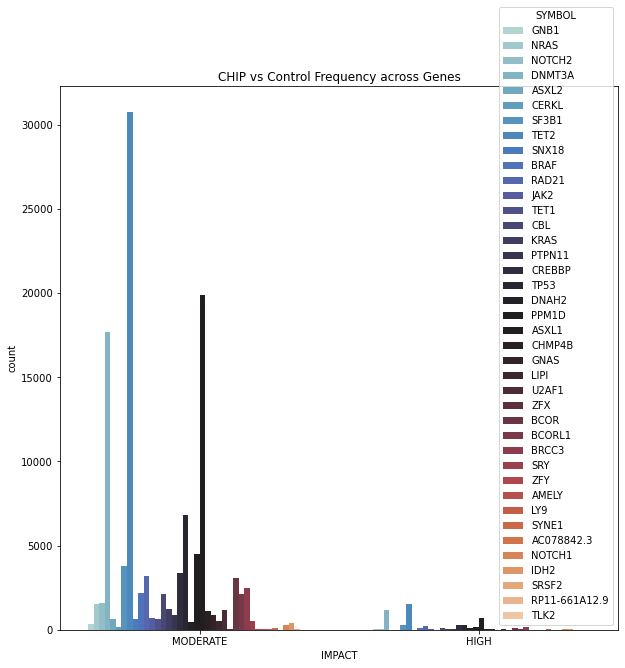

In [562]:
fig = plt.figure(figsize = (10, 10))
geneplot = sns.countplot(x= 'IMPACT', data = dfgene, hue = 'SYMBOL', palette='icefire')
geneplot.set_title("CHIP vs Control Frequency across Genes")
# geneplot.legend_.remove()

In [569]:
profile = pp.ProfileReport(dataset1, title="Pandas Profiling Report")

In [570]:
profile

Summarize dataset:   0%|          | 0/30 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
dfgene = preprocessing.loci_split(dfgene)

In [581]:
profile2 = pp.ProfileReport(dfgene2, title="Pandas Profiling Report")

In [582]:
profile2

Summarize dataset:   0%|          | 0/31 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [577]:
dfgene2 = dfgene.copy(deep=True)

In [578]:
dfgene2.columns

Index(['DP', 'VD', 'AF', 'HIAF', 'IMPACT', 'SYMBOL', 'sampleTimePt', 'gender',
       'MSID', 'BIAS', 'REFBIAS', 'VARBIAS', 'QUAL', 'ODDRATIO',
       'chipOrControl', 'chromosome', 'chromosome_loc', 'nucleotide'],
      dtype='object')

In [580]:
dfgene2.drop(['chromosome_loc'], axis=1, inplace=True)

In [584]:
dfgene.SYMBOL.unique()

array(['GNB1', 'NRAS', 'NOTCH2', 'DNMT3A', 'ASXL2', 'CERKL', 'SF3B1',
       'TET2', 'SNX18', 'BRAF', 'RAD21', 'JAK2', 'TET1', 'CBL', 'KRAS',
       'PTPN11', 'CREBBP', 'TP53', 'DNAH2', 'PPM1D', 'ASXL1', 'CHMP4B',
       'GNAS', 'LIPI', 'U2AF1', 'ZFX', 'BCOR', 'BCORL1', 'BRCC3', 'SRY',
       'ZFY', 'AMELY', 'LY9', 'SYNE1', 'AC078842.3', 'NOTCH1', 'IDH2',
       'SRSF2', 'RP11-661A12.9', 'TLK2'], dtype=object)

In [590]:
dfgene

,DP,VD,AF,HIAF,IMPACT,SYMBOL,sampleTimePt,gender,MSID,BIAS,REFBIAS,VARBIAS,QUAL,ODDRATIO,chipOrControl,chromosome,chromosome_loc,nucleotide
0,7281,26,0.003600,0.003300,MODERATE,GNB1,Baseline,Male,MS2083,2:2,3644:3596,12:14,34.000000,1.182210,CHIP,chr1,1747196,T/C
4,7282,29,0.004000,0.003600,MODERATE,GNB1,Baseline,Male,MS2083,2:2,3639:3606,15:14,32.700000,1.061729,CHIP,chr1,1747250,T/C
8,7282,24,0.003300,0.003300,MODERATE,GNB1,Baseline,Male,MS2083,2:2,3626:3607,12:12,34.900000,1.005270,CHIP,chr1,1747256,T/C
12,178,2,0.011200,0.012000,MODERATE,NRAS,Baseline,Male,MS2083,2:2,88:88,1:1,37.000000,1.000000,CHIP,chr1,115256571,T/C
13,1773,6,0.003400,0.003500,MODERATE,NRAS,Baseline,Male,MS2083,2:2,889:874,3:3,37.000000,1.017150,CHIP,chr1,115258674,T/C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
536725,711,2,0.002800,0.002800,MODERATE,BRCC3,Y3,Female,MS6625,2:2,356:353,1:1,31.000000,1.008490,Control,chrX,154305513,C/T
536726,711,2,0.002800,0.002900,MODERATE,BRCC3,Y3,Female,MS6625,2:2,355:353,1:1,37.000000,1.005660,Control,chrX,154305518,T/C
536733,711,2,0.002800,0.002900,HIGH,BRCC3,Y3,Female,MS6625,2:2,355:353,1:1,37.000000,1.005660,Control,chrX,154305518,T/C
536734,711,2,0.002800,0.002900,MODERATE,BRCC3,Y3,Female,MS6625,2:2,356:353,1:1,37.000000,1.008490,Control,chrX,154305533,A/T


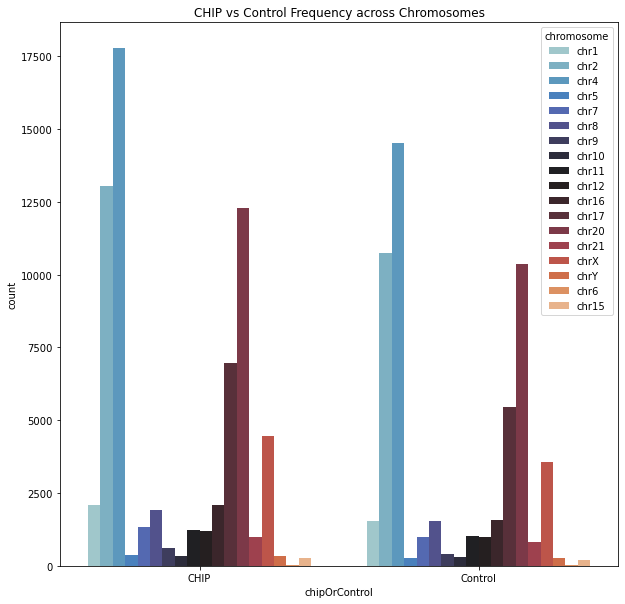

In [661]:
fig = plt.figure(figsize = (10, 10))
chrplot = sns.countplot(x= 'chipOrControl', data = dfgene, hue = 'chromosome', palette='icefire')
chrplot.set_title("CHIP vs Control Frequency across Chromosomes");

# Final Results

In [780]:
res1 = {}
res2 = {}

res1['K Neighbours'] = np.round(accuracy_score(y_test, y_predknn),3)*100
res2['K Neighbours'] = np.round(accuracy_score(y_test2, y_predknn2),3)*100

res1['Random Forest'] = np.round(accuracy_score(y_test, y_predrfc),3)*100
res2['Random Forest'] = np.round(accuracy_score(y_test2, y_predrfc2),3)*100

res1['AdaBoost'] = np.round(accuracy_score(y_test, y_predada),3)*100
res2['AdaBoost'] = np.round(accuracy_score(y_test2, y_predada2),3)*100

res1['XG Boost'] = np.round(accuracy_score(y_test, y_predxgb),3)*100
res2['XG Boost'] = np.round(accuracy_score(y_test2, y_predxgb2),3)*100

res1['Decision Trees'] = np.round(accuracy_score(y_test, y_preddct),3)*100
res2['Decision Trees'] = np.round(accuracy_score(y_test2, y_preddct2),3)*100

res1['Logistic Regression'] = np.round(accuracy_score(y_test, y_predlogreg),3)*100
res2['Logistic Regression'] = np.round(accuracy_score(y_test2, y_predlogreg2),3)*100

res1['Guassian Naive Bayes'] = np.round(accuracy_score(y_test, y_predgnb),3)*100
res2['Guassian Naive Bayes'] = np.round(accuracy_score(y_test2, y_predgnb2),3)*100

res1['Light Gradient Boosting'] = np.round(accuracy_score(y_test, y_predlgb),3)*100
res2['Light Gradient Boosting'] = np.round(accuracy_score(y_test2, y_predlgb2),3)*100

In [952]:
results = pd.DataFrame()
results['Dataset 1'] = pd.Series(res1)
results['Dataset 2'] = pd.Series(res2)
results

,Dataset 1,Dataset 2
K Neighbours,81.500,63.000
Random Forest,72.300,62.500
AdaBoost,80.700,68.900
XG Boost,75.600,63.200
Decision Trees,78.800,66.100
Logistic Regression,54.700,52.100
Guassian Naive Bayes,52.700,48.800
Light Gradient Boosting,67.500,62.300


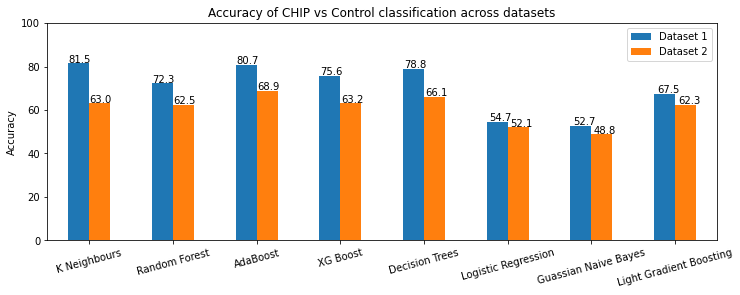

In [1126]:
ax = results.round(2).plot(kind='bar', rot=15)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x()*1.005, p.get_height()*1.005))
plt.ylabel("Accuracy")
plt.title("Accuracy of CHIP vs Control classification across datasets")
plt.ylim(0, 100, 10);

In [805]:
pd.options.display.float_format = "{:,.3f}".format

In [811]:
results.T

,K Neighbours,Random Forest,AdaBoost,XG Boost,Decision Trees,Logistic Regression,Guassian Naive Bayes,Light Gradient Boosting
Dataset 1,0.815,0.723,0.807,0.756,0.788,0.547,0.527,0.675
Dataset 2,0.630,0.625,0.689,0.632,0.661,0.521,0.488,0.623


In [940]:
res1f = {}
res2f = {}

res1f['K Neighbours'] = np.round(accuracy_score(y_testf, y_predknnf),3)*100
res2f['K Neighbours'] = np.round(accuracy_score(y_test2f, y_predknn2f),3)*100

res1f['Random Forest'] = np.round(accuracy_score(y_testf, y_predrfcf),3)*100
res2f['Random Forest'] = np.round(accuracy_score(y_test2f, y_predrfc2f),3)*100

res1f['AdaBoost'] = np.round(accuracy_score(y_testf, y_predadaf),3)*100
res2f['AdaBoost'] = np.round(accuracy_score(y_test2f, y_predadaf2),3)*100

res1f['XG Boost'] = np.round(accuracy_score(y_testf, y_predxgb),3)*100
res2f['XG Boost'] = np.round(accuracy_score(y_test2f, y_predxgb2),3)*100

res1f['Decision Trees'] = np.round(accuracy_score(y_testf, y_preddctf),3)*100
res2f['Decision Trees'] = np.round(accuracy_score(y_test2f, y_preddt2f),3)*100

res1f['Logistic Regression'] = np.round(accuracy_score(y_testf, y_predlogregf),3)*100
res2f['Logistic Regression'] = np.round(accuracy_score(y_test2f, y_predlogreg2f),3)*100

res1f['Guassian Naive Bayes'] = np.round(accuracy_score(y_testf, y_predgnbf),3)*100
res2f['Guassian Naive Bayes'] = np.round(accuracy_score(y_test2f, y_predgnb2f),3)*100

res1f['Light Gradient Boosting'] = np.round(accuracy_score(y_testf, y_predlgbf),3)*100
res2f['Light Gradient Boosting'] = np.round(accuracy_score(y_test2f, y_predlgb2f),3)*100

In [947]:
results2 = pd.DataFrame()
results2['Dataset 1 Flipped'] = pd.Series(res1f)
results2['Dataset 2 Flipped'] = pd.Series(res2f)
results2

,Dataset 1 Flipped,Dataset 2 Flipped
K Neighbours,82.600,63.300
Random Forest,73.600,62.900
AdaBoost,82.300,69.200
XG Boost,74.400,63.200
Decision Trees,79.300,66.000
Logistic Regression,59.900,52.100
Guassian Naive Bayes,46.300,48.800
Light Gradient Boosting,69.700,62.300


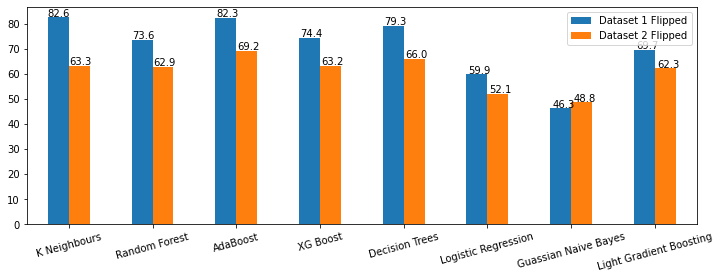

In [948]:
ax = results2.round(2).plot(kind='bar', rot=15)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x()*1.005, p.get_height()*1.005))

In [953]:
restotal = pd.concat([results, results2],axis=1)

In [954]:
restotal

,Dataset 1,Dataset 2,Dataset 1 Flipped,Dataset 2 Flipped
K Neighbours,81.500,63.000,82.600,63.300
Random Forest,72.300,62.500,73.600,62.900
AdaBoost,80.700,68.900,82.300,69.200
XG Boost,75.600,63.200,74.400,63.200
Decision Trees,78.800,66.100,79.300,66.000
Logistic Regression,54.700,52.100,59.900,52.100
Guassian Naive Bayes,52.700,48.800,46.300,48.800
Light Gradient Boosting,67.500,62.300,69.700,62.300


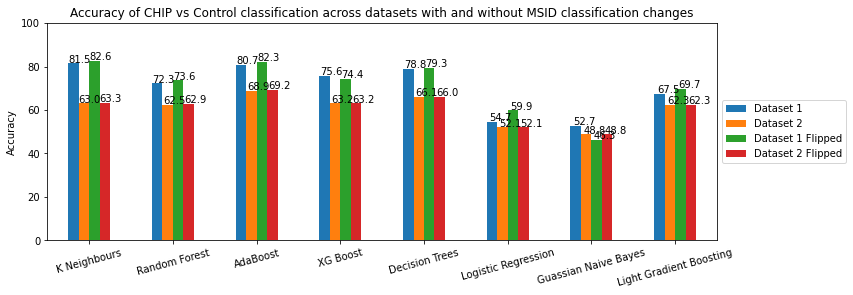

In [1128]:
ax = restotal.round(2).plot(kind='bar', rot=15)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x()*1.005, p.get_height()*1.005))
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel("Accuracy")
plt.title("Accuracy of CHIP vs Control classification across datasets with and without MSID classification changes")
plt.ylim(0, 100, 10);

In [962]:
higherror

,run1_avg,run2_avg,chipOrControl
MS10080,0.304,0.397,1.000
MS13090,0.323,0.429,1.000
MS13994,0.324,0.441,1.000
MS17137,0.334,0.445,1.000
MS5053,0.330,0.399,1.000
MS5082,0.338,0.463,1.000
MS7260,0.317,0.524,1.000
MS8519,0.360,0.404,1.000
MS917,0.362,0.413,1.000


In [967]:
chipdict = {0: "CHIP", 1: "Control"}

In [970]:
higherror.replace({"chipOrControl": chipdict}, inplace=True)

In [972]:
errors.replace({"chipOrControl": chipdict}, inplace=True)

In [973]:
errors

,run1_avg,run2_avg,chipOrControl
MS10080,0.304,0.397,Control
MS10108,0.253,0.349,CHIP
MS10284,0.286,0.473,Control
MS10285,0.207,0.314,CHIP
MS10716,0.220,0.389,CHIP
...,...,...,...
MS8569,0.149,0.355,CHIP
MS8886,0.277,0.446,Control
MS917,0.362,0.413,Control
MS9695,0.178,0.330,CHIP


In [1155]:
higherror.style.set_caption("MSID with high inaccuracy rates per dataset, minimum 30% and 35% respectively")

,run1_avg,run2_avg,chipOrControl
MS10080,0.304264,0.396861,Control
MS13090,0.322981,0.428571,Control
MS13994,0.323864,0.441489,Control
MS17137,0.333916,0.444976,Control
MS5053,0.329646,0.399148,Control
MS5082,0.337500,0.462670,Control
MS7260,0.317235,0.524221,Control
MS8519,0.360390,0.403974,Control
MS917,0.362245,0.413333,Control


In [1003]:
print(dataset1.shape)
print(dataset2.shape)

(1137949, 17)
(1412741, 17)


In [1024]:
msid_list = df.MSID.unique()

In [1033]:
from cleanlab.latent_estimation import (estimate_py_noise_matrices_and_cv_pred_proba)

est_py, est_nm, est_inv, confident_joint, psx = (
    estimate_py_noise_matrices_and_cv_pred_proba(
        X = X_train.to_numpy(),
        s = y_train.to_numpy(),
    )
)

In [1044]:
est_py

array([0.22346656, 0.77653344])

In [1045]:
est_nm

array([[0.56105991, 0.55191325],
       [0.43894009, 0.44808675]])

In [1047]:
confident_joint

array([[11688, 39953],
       [ 9144, 32437]])

In [1048]:
psx

array([[0.5504991 , 0.4495009 ],
       [0.55251686, 0.44748314],
       [0.55123444, 0.44876556],
       ...,
       [0.56489256, 0.43510744],
       [0.56643076, 0.43356924],
       [0.55298554, 0.44701446]])

In [1055]:
y_train.value_counts(normalize=True)

0   0.554
1   0.446
Name: chipOrControl, dtype: float64

In [1167]:
est_py2, est_nm2, est_inv2, confident_joint2, psx2 = (
    estimate_py_noise_matrices_and_cv_pred_proba(
        X = X_train2.to_numpy(),
        s = y_train2.to_numpy(),
    )
)

In [1042]:
lnl = LearningWithNoisyLabels(clf=BaggingClassifier()) 
lnl.fit(X = X_train.to_numpy(), s=y_train.to_numpy(), noise_matrix = est_nm) 
# Estimate the predictions you would have gotten by training with *no* label errors.
predicted_test_labels = lnl.predict(X_test)
print(round(accuracy_score(predicted_test_labels, y_test), 3))

0.767


In [1043]:
lnl_ada = LearningWithNoisyLabels(clf=AdaBoostClassifier(DecisionTreeClassifier(), n_estimators=50, learning_rate = 0.5, algorithm= 'SAMME')) 
lnl_ada.fit(X = X_train.to_numpy(), s=y_train.to_numpy(), noise_matrix = est_nm) 
# Estimate the predictions you would have gotten by training with *no* label errors.
lnl_pred_ada = lnl_ada.predict(X_test)
print(round(accuracy_score(lnl_pred_ada, y_test), 3))

0.778


In [1057]:
from cleanlab.noise_generation import noise_matrix_is_valid
is_valid = noise_matrix_is_valid(
  noise_matrix=est_nm,
  py=est_py,
)
is_valid

True

In [1065]:
from cleanlab.latent_estimation import compute_confident_joint
joint = compute_confident_joint(s=y_train.to_numpy(), psx=psx)
joint

array([[11688, 39953],
       [ 9144, 32437]])

In [1142]:
print("Joint distribution of Noisy vs True labels:")
print(joint)

Joint distribution of Noisy vs True labels:
[[11688 39953]
 [ 9144 32437]]


In [1115]:
res1_cleanlab = {}
res2_cleanlab = {}

res1_cleanlab['K Neighbours'] = np.round(accuracy_score(y_testf, pred_lnl_knn1),3)*100
res2_cleanlab['K Neighbours'] = np.round(accuracy_score(y_test2f, pred_lnl_knn2),3)*100

res1_cleanlab['Random Forest'] = np.round(accuracy_score(y_testf, pred_lnl_rfc1),3)*100
res2_cleanlab['Random Forest'] = np.round(accuracy_score(y_test2f, pred_lnl_rfc2),3)*100

res1_cleanlab['AdaBoost'] = np.round(accuracy_score(y_testf, pred_lnl_ada1),3)*100
res2_cleanlab['AdaBoost'] = np.round(accuracy_score(y_test2f, pred_lnl_ada2),3)*100

res1_cleanlab['XG Boost'] = np.round(accuracy_score(y_testf, pred_lnl_xg1),3)*100
res2_cleanlab['XG Boost'] = np.round(accuracy_score(y_test2f, pred_lnl_xg2),3)*100

res1_cleanlab['Decision Trees'] = np.round(accuracy_score(y_testf, pred_lnl_dct1),3)*100
res2_cleanlab['Decision Trees'] = np.round(accuracy_score(y_test2f, pred_lnl_dct2),3)*100

res1_cleanlab['Logistic Regression'] = np.round(accuracy_score(y_testf, pred_lnl_log1),3)*100
res2_cleanlab['Logistic Regression'] = np.round(accuracy_score(y_test2f, pred_lnl_log2),3)*100

res1_cleanlab['Guassian Naive Bayes'] = np.round(accuracy_score(y_testf, pred_lnl_gb1),3)*100
res2_cleanlab['Guassian Naive Bayes'] = np.round(accuracy_score(y_test2f, pred_lnl_gb2),3)*100

res1_cleanlab['Light Gradient Boosting'] = np.round(accuracy_score(y_testf, pred_lnl_lg1),3)*100
res2_cleanlab['Light Gradient Boosting'] = np.round(accuracy_score(y_test2f, pred_lnl_lg2),3)*100

In [1116]:
results_lnl = pd.DataFrame()
results_lnl['Cleanlab Dataset 1'] = pd.Series(res1_cleanlab)
results_lnl['Cleanlab Dataset 2'] = pd.Series(res2_cleanlab)
results_lnl

,Cleanlab Dataset 1,Cleanlab Dataset 2
K Neighbours,76.600,60.100
Random Forest,68.500,60.100
AdaBoost,75.900,64.700
XG Boost,71.600,62.400
Decision Trees,73.200,60.200
Logistic Regression,53.800,51.600
Guassian Naive Bayes,44.200,49.000
Light Gradient Boosting,64.900,60.600


In [1117]:
res_lnl = pd.concat([results, results_lnl],axis=1)

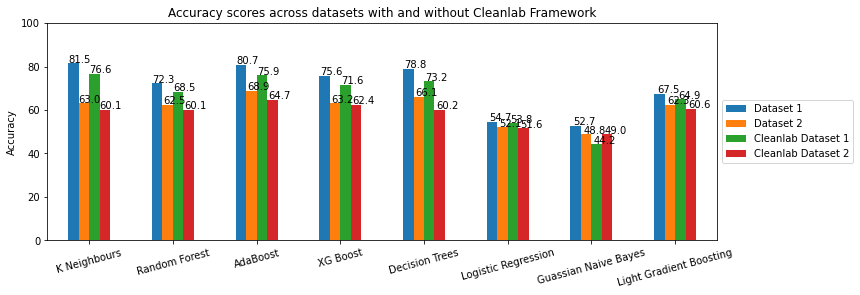

In [1129]:
ax = res_lnl.round(2).plot(kind='bar', rot=15)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x()*1.005, p.get_height()*1.005))
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel("Accuracy")
plt.title("Accuracy scores across datasets with and without Cleanlab Framework")
plt.ylim(0, 100, 10);

In [1176]:
dataset1.QUAL.describe()

count   1,137,949.000
mean           35.438
std             2.684
min            22.500
25%            34.800
50%            37.000
75%            37.000
max            37.000
Name: QUAL, dtype: float64

In [1174]:
dataset2.QUAL.describe()

count   1,412,741.000
mean           32.105
std             4.476
min            22.500
25%            28.300
50%            32.800
75%            37.000
max            37.000
Name: QUAL, dtype: float64